In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from data_utils import *
from eda_utils import *
from train_utils import *
from sklearn.preprocessing import MinMaxScaler

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


# Data Preprocessing

## Dataset creation

In [3]:
phyt_cod_path = 'data/PHYT_COD_ForDvirLafer.csv'
phyto_path = 'data/Phyto4DvirLafer.csv'

biomass_by_week_year_group = get_biomass_data(phyt_cod_path, phyto_path)

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.


In [4]:
fp_path = 'data/FP_2017_ForDvirLafer.csv'

fp_df = get_fluorprobe_data(fp_path)

Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.


In [5]:
fp_df['depth_discrete'] = fp_df['depth'].apply(lambda x: min(biomass_by_week_year_group['Depth'], key=lambda y: abs(y - x)))

## Fluorprobe outliers exploration

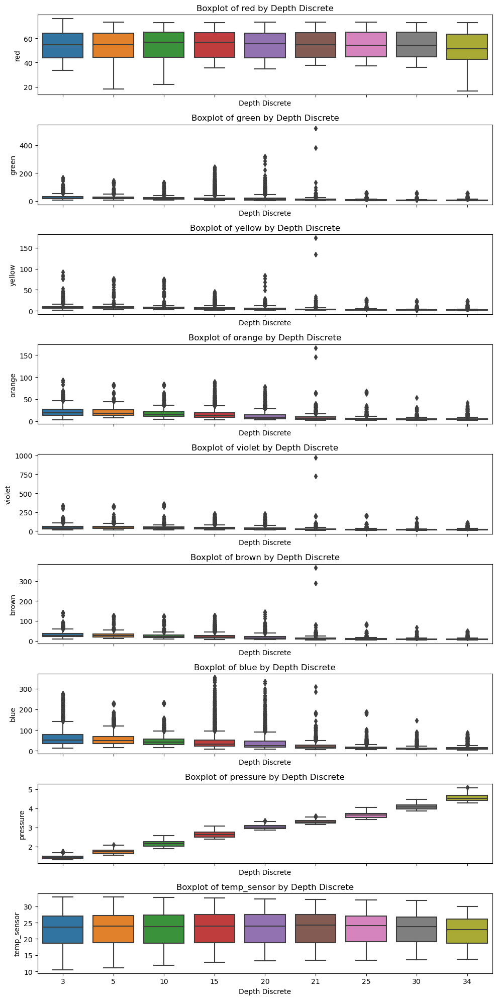

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have already loaded and prepared your DataFrame 'fp_df'

# List of signals you want to plot
signals = ['red', 'green', 'yellow', 'orange', 'violet', 'brown', 'blue', 'pressure', 'temp_sensor']

# Create subplots
fig, axes = plt.subplots(nrows=len(signals), ncols=1, figsize=(10, 20), sharex=True)

# Loop through each signal and create a boxplot
for idx, signal in enumerate(signals):
    ax = axes[idx]
    sns.boxplot(x='depth_discrete', y=signal, data=fp_df, ax=ax)
    ax.set_ylabel(signal)
    ax.set_xlabel('Depth Discrete')
    ax.set_title(f'Boxplot of {signal} by Depth Discrete')

plt.tight_layout()
plt.show()

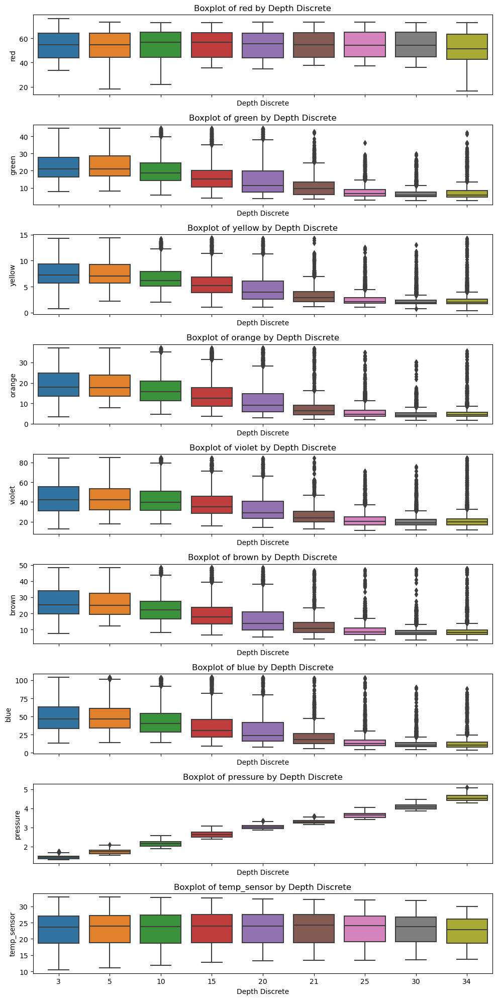

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have already loaded and prepared your DataFrame 'fp_df'

# List of signals you want to plot
signals = ['red', 'green', 'yellow', 'orange', 'violet', 'brown', 'blue', 'pressure', 'temp_sensor']
# Dictionary to store records to be removed for each signal
records_to_remove = {signal: [] for signal in signals}

# Create subplots
fig, axes = plt.subplots(nrows=len(signals), ncols=1, figsize=(10, 20), sharex=True)

boundaries = {
    'green': {'lower_bound': 0, 'upper_bound': 100},
    'yellow': {'lower_bound': 0, 'upper_bound': 30},
    'orange': {'lower_bound': 0, 'upper_bound': 40},
    'orange': {'lower_bound': 0, 'upper_bound': 40},

}
# Loop through each signal and create a boxplot
for idx, signal in enumerate(signals):
    ax = axes[idx]
    
    # Calculate IQR
    q1 = fp_df[signal].quantile(0.25)
    q3 = fp_df[signal].quantile(0.75)
    iqr = q3 - q1
    
    # Define upper and lower bounds to filter out outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    # Filter the DataFrame
    filtered_df = fp_df[(fp_df[signal] >= lower_bound) & (fp_df[signal] <= upper_bound)]
    
    # Identify records to be removed
    outliers = fp_df[(fp_df[signal] < lower_bound) | (fp_df[signal] > upper_bound)]
    
    # Accumulate records to be removed
    records_to_remove[signal].extend(outliers.index.tolist())
    
    # Create the boxplot with the filtered data
    sns.boxplot(x='depth_discrete', y=signal, data=filtered_df, ax=ax)
    ax.set_ylabel(signal)
    ax.set_xlabel('Depth Discrete')
    ax.set_title(f'Boxplot of {signal} by Depth Discrete')

plt.tight_layout()
plt.show()


In [16]:
# Flatten the list of indices to remove
indices_to_remove = set(idx for lst in records_to_remove.values() for idx in lst)

# Remove accumulated records from 'fp_df'
filtered_df = fp_df.drop(index=indices_to_remove)
filtered_df

,depth,red,green,yellow,orange,violet,brown,blue,pressure,temp_sensor,Green Algae,Bluegreen,Diatoms,Cryptophyta,Total conc,week,year,month,depth_discrete
18,1.53,62.74,21.95,6.85,17.53,48.68,24.67,49.79,1.30,16.56,9.74,0.29,1.63,5.95,17.62,49,2019,12,3
19,1.60,62.66,21.76,7.25,17.09,47.80,24.32,49.24,1.31,16.59,9.80,0.02,1.16,6.36,17.33,49,2019,12,3
20,1.71,62.43,21.45,7.45,17.27,48.64,24.72,50.14,1.32,16.57,10.77,0.00,0.63,6.45,17.84,49,2019,12,3
21,1.81,62.61,21.89,7.23,17.14,48.78,24.13,50.87,1.33,16.59,10.46,0.00,1.53,6.00,17.99,49,2019,12,3
22,1.95,62.65,21.80,7.37,17.84,48.13,24.91,49.41,1.34,16.57,9.92,0.27,1.16,6.29,17.64,49,2019,12,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45189,36.56,41.90,6.95,2.75,5.40,20.68,9.50,11.33,4.73,26.19,0.00,0.40,0.63,0.52,1.55,27,2022,7,34
45190,37.02,42.14,6.86,2.45,5.18,20.54,9.27,10.87,4.78,26.18,0.00,0.39,0.55,0.49,1.43,27,2022,7,34
45191,37.43,41.99,7.12,2.60,5.49,21.09,9.59,11.70,4.82,26.12,0.00,0.43,0.78,0.43,1.64,27,2022,7,34
45192,37.69,42.01,7.03,2.67,5.22,20.78,9.58,11.20,4.85,26.13,0.00,0.35,0.47,0.65,1.48,27,2022,7,34


In [89]:
filtered_df.drop('depth_discrete', axis=1, inplace=True)

## Splitting to test temporarily & Extracting probe's test data

In [90]:
merged_df = merge_fp_biomass_df(filtered_df, biomass_by_week_year_group)

In [91]:
merged_df_test = merged_df[(merged_df['year'] == 2022) & (merged_df['month'] >= 4)]
merged_df = merged_df[~merged_df.index.isin(merged_df_test.index)]

orig_merged_df = merged_df.copy()

merged_df = merged_df.drop(['week'], axis=1)
merged_df_test = merged_df_test.drop(['week'], axis=1)

In [92]:
merged_df = merged_df.drop(['Green Algae', 'Bluegreen', 'Diatoms', 'Cryptophyta'], axis=1).reset_index(drop=True)

fluor_groups_map = {
    2: 'Bluegreen',
    3: 'Diatoms',
    4: 'Green Algae',
    6: 'Cryptophyta'
}

fluor_test_df = merged_df_test[['group_num', 'month', 'Depth', 'pressure', 'temp_sensor', 'sum_biomass_ug_ml', 'Green Algae', 'Bluegreen', 'Diatoms', 'Cryptophyta', 'Total conc']].reset_index(drop=True)
merged_df_test = merged_df_test.drop(['Green Algae', 'Bluegreen', 'Diatoms', 'Cryptophyta'], axis=1).reset_index(drop=True)

# Plot

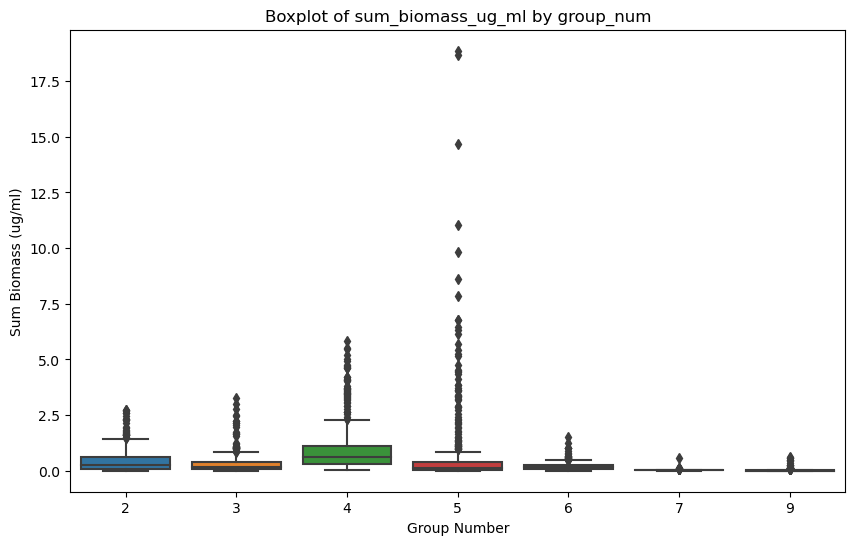

In [93]:
boxplot(merged_df)

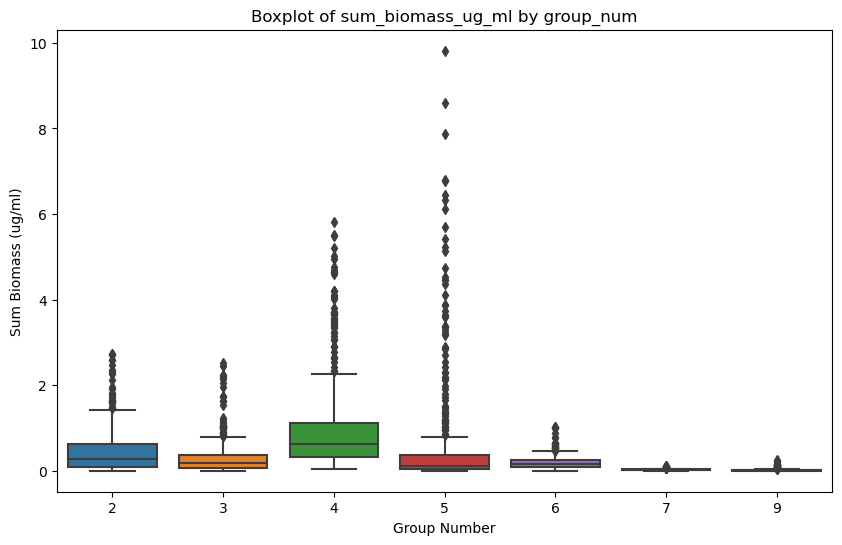

In [94]:
filtered_df = remove_outliers_IQR(merged_df, q1=0.05, q3=0.95)
merged_df = filtered_df
boxplot(filtered_df)

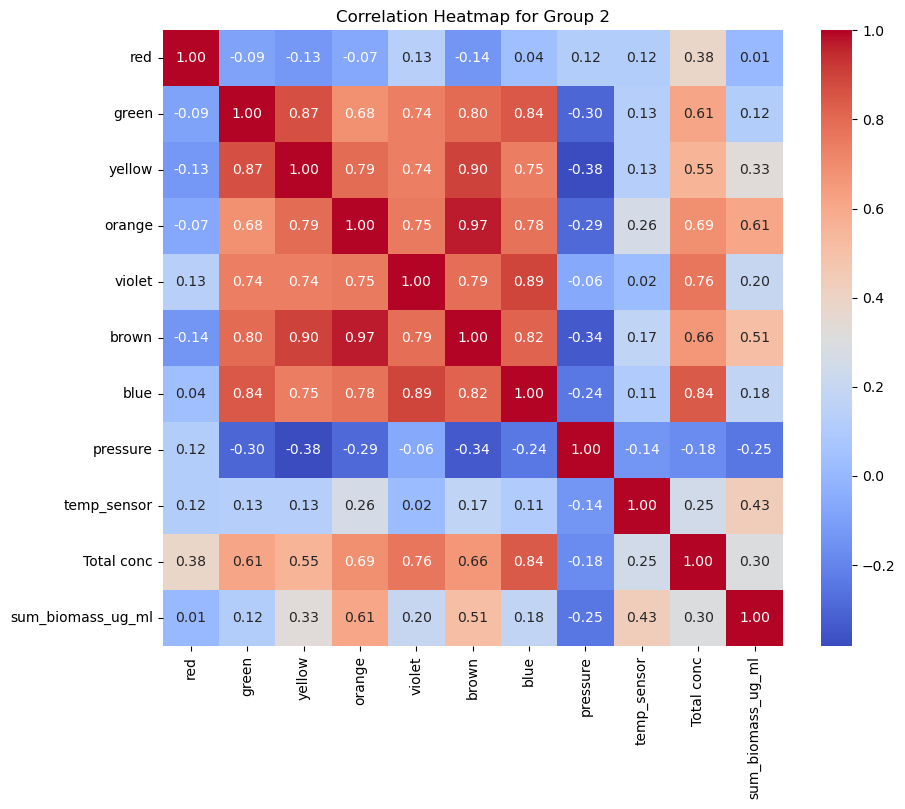

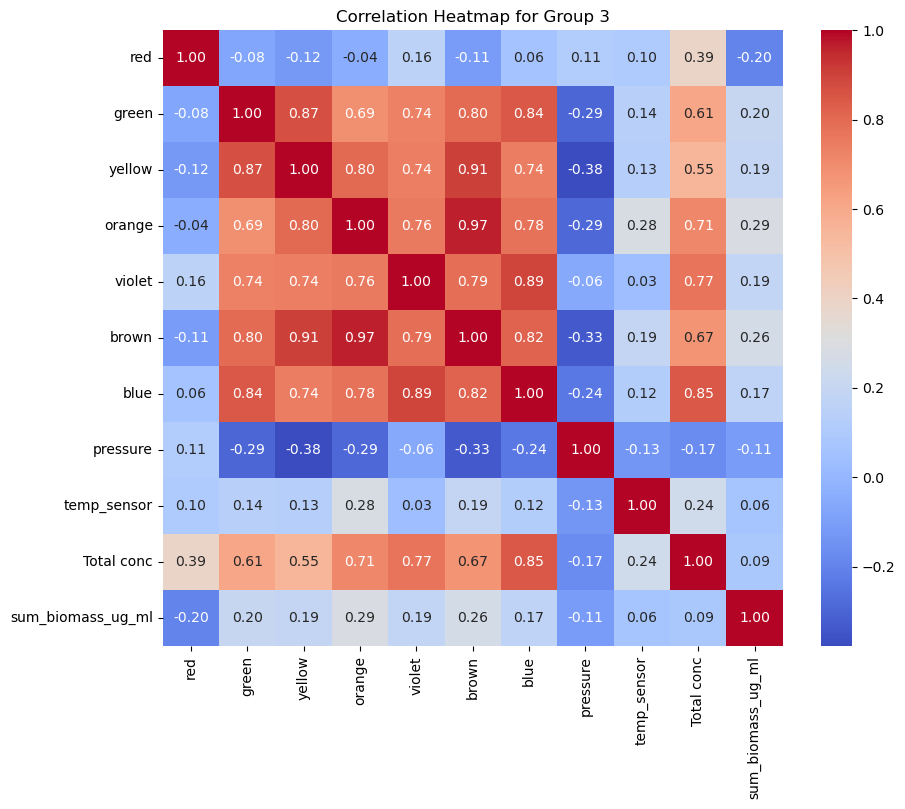

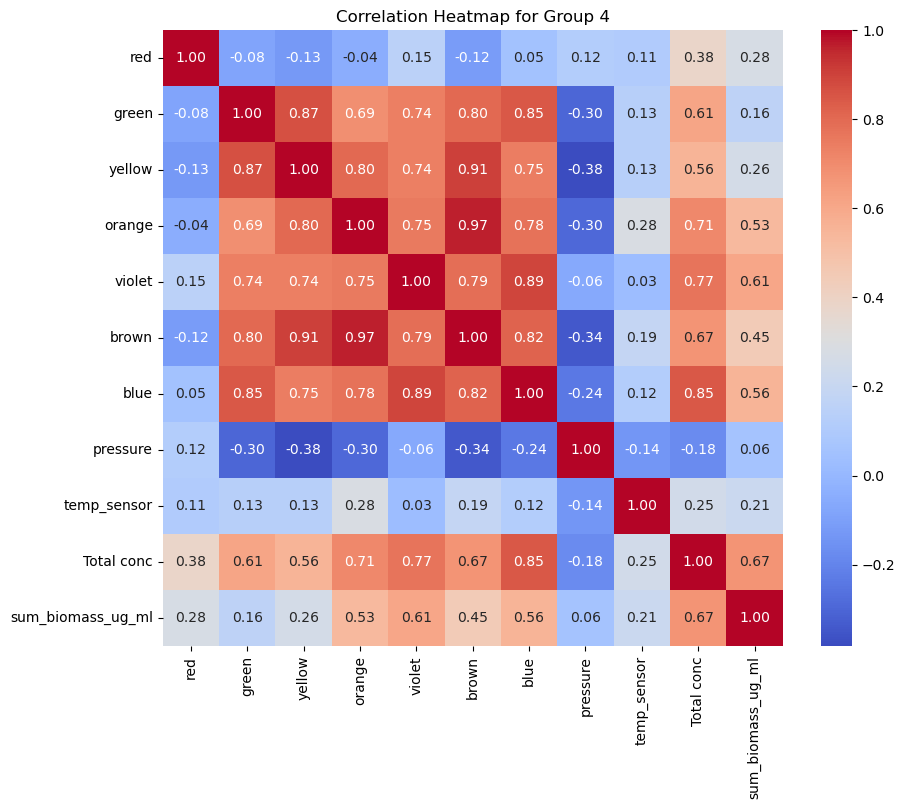

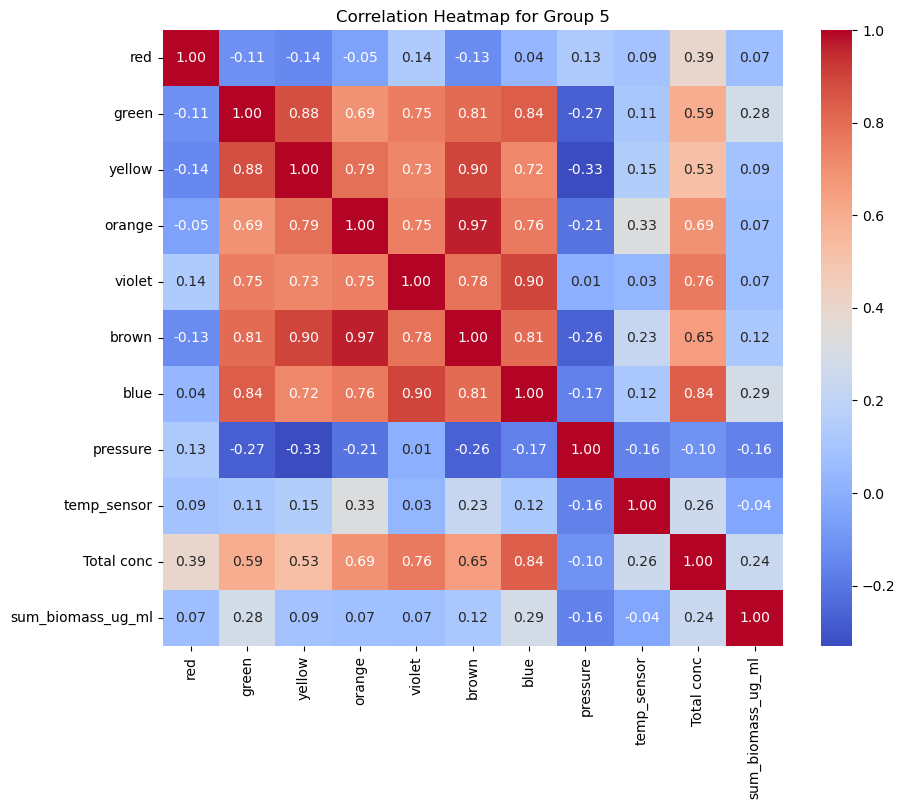

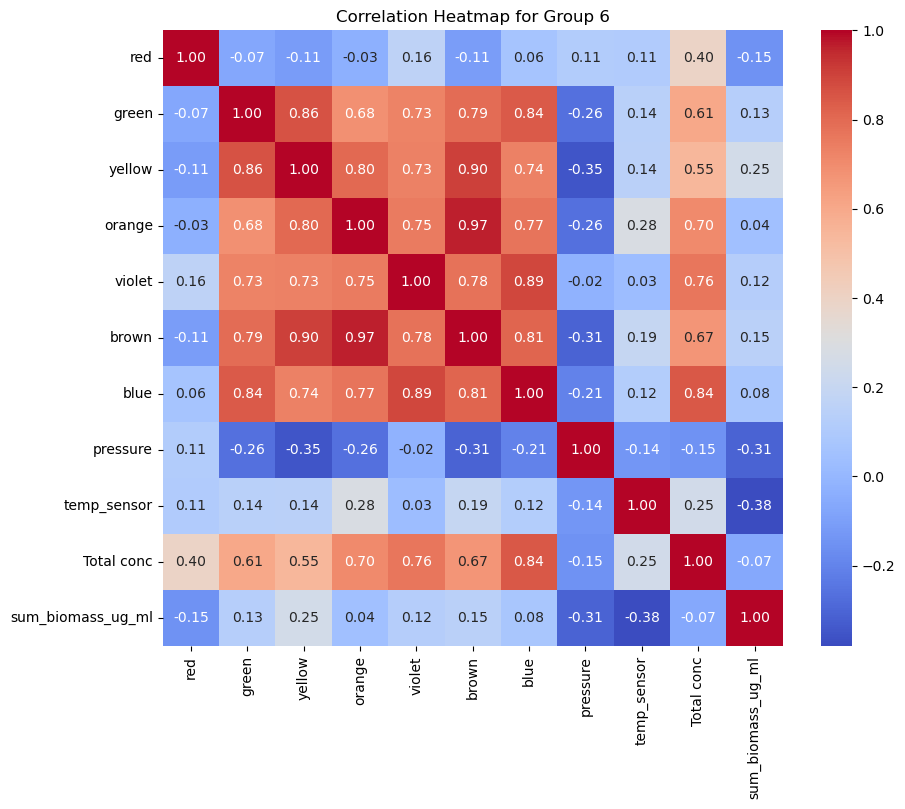

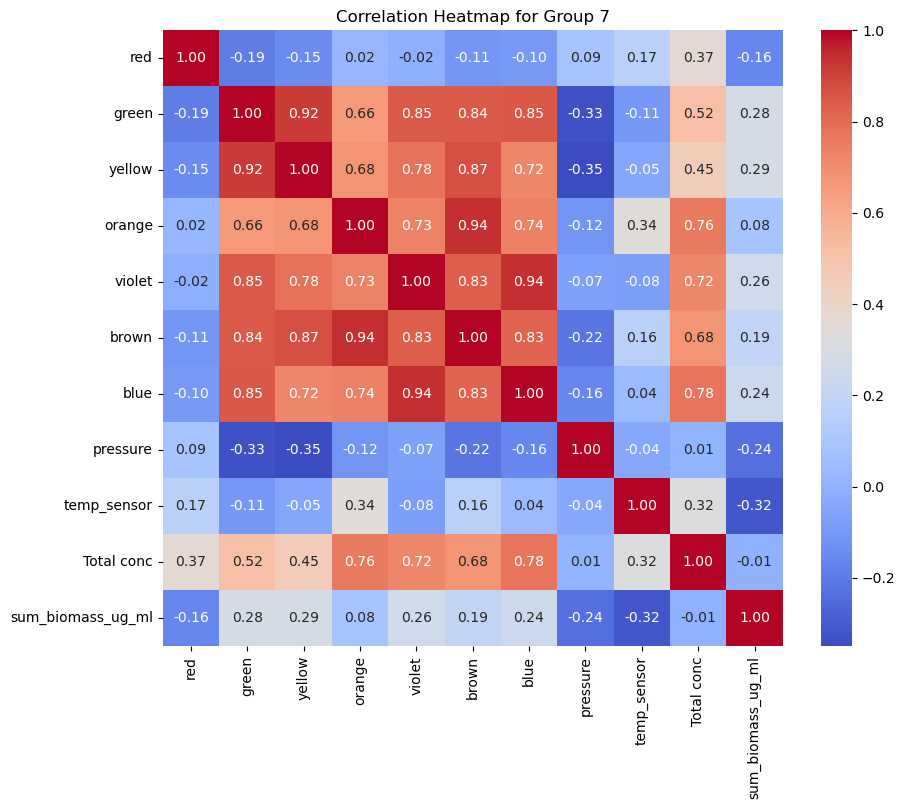

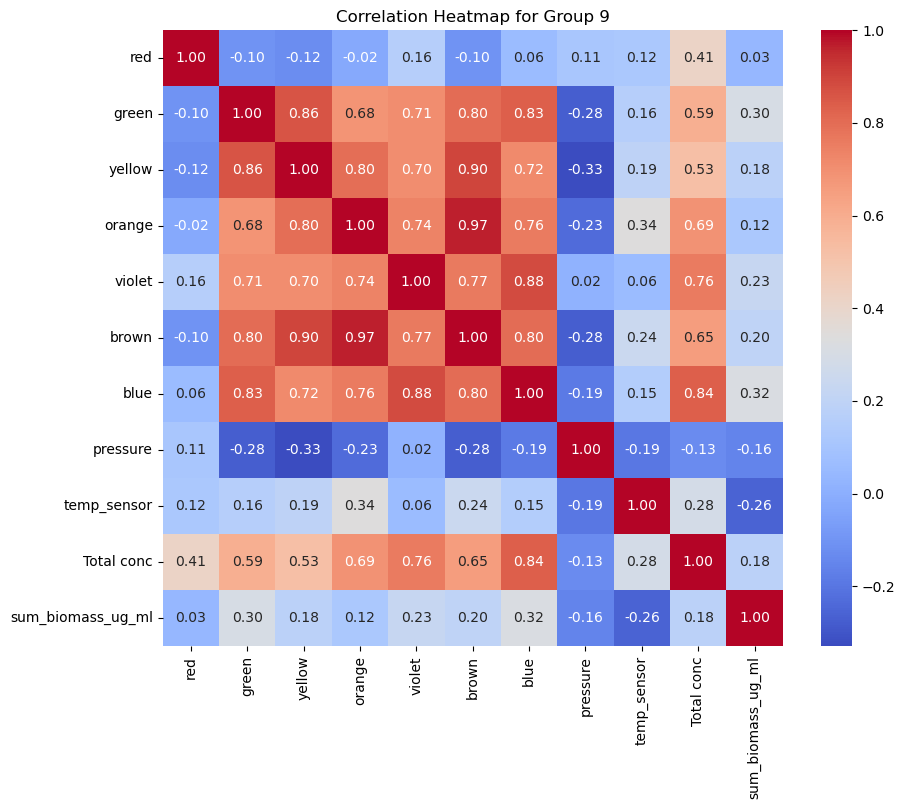

In [95]:
correlation_per_group(merged_df)

In [96]:
# keep_cols = ['red', 'green', 'orange', 'pressure', 'temp_sensor', 'Total conc', 'sum_biomass_ug_ml', 'group_num']

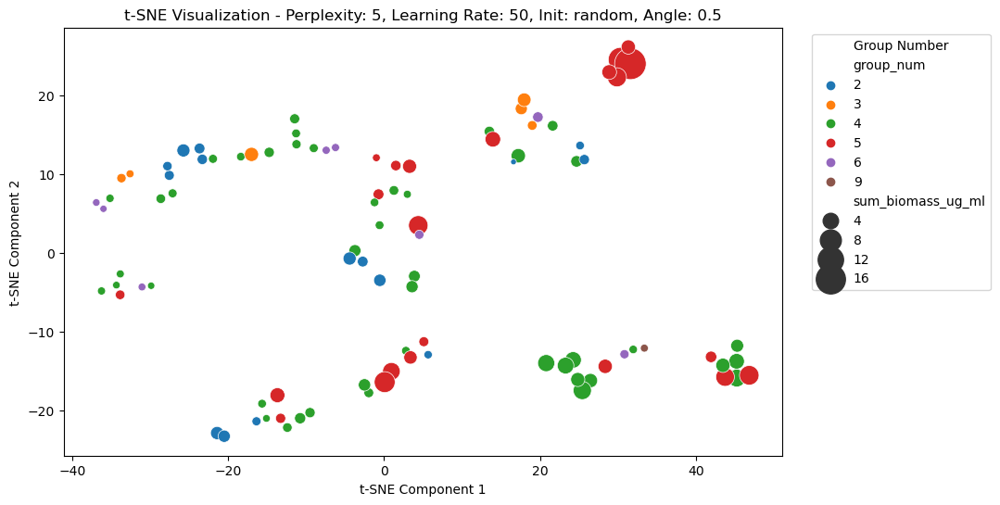

In [97]:
plot_tsne(orig_merged_df)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


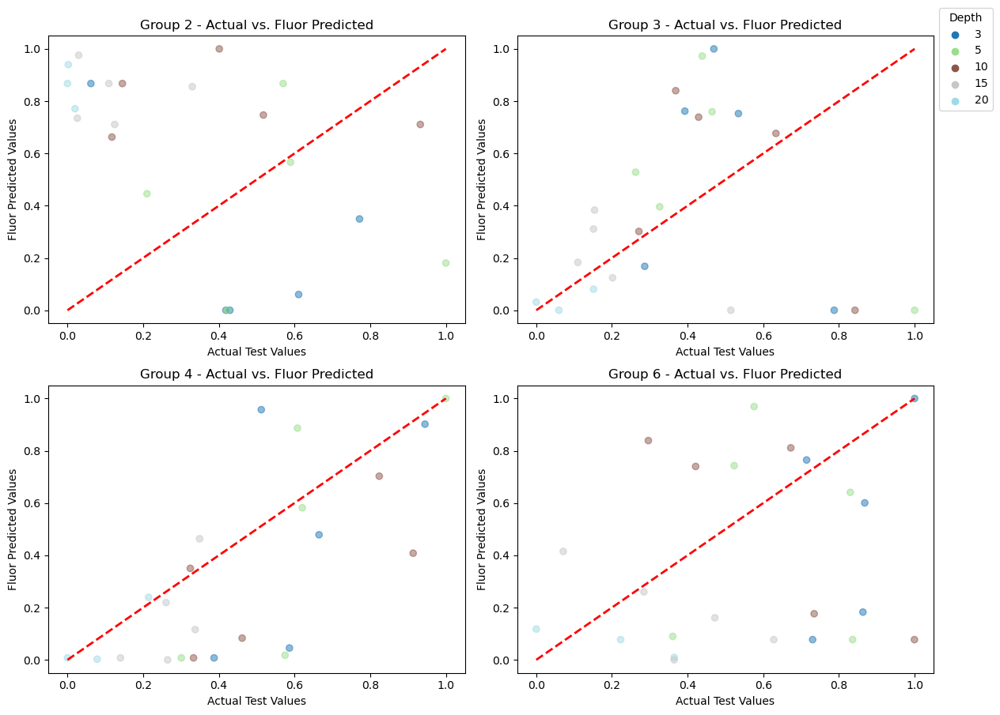

In [99]:
plot_fluorprobe_prediction(fluor_test_df, fluor_groups_map)

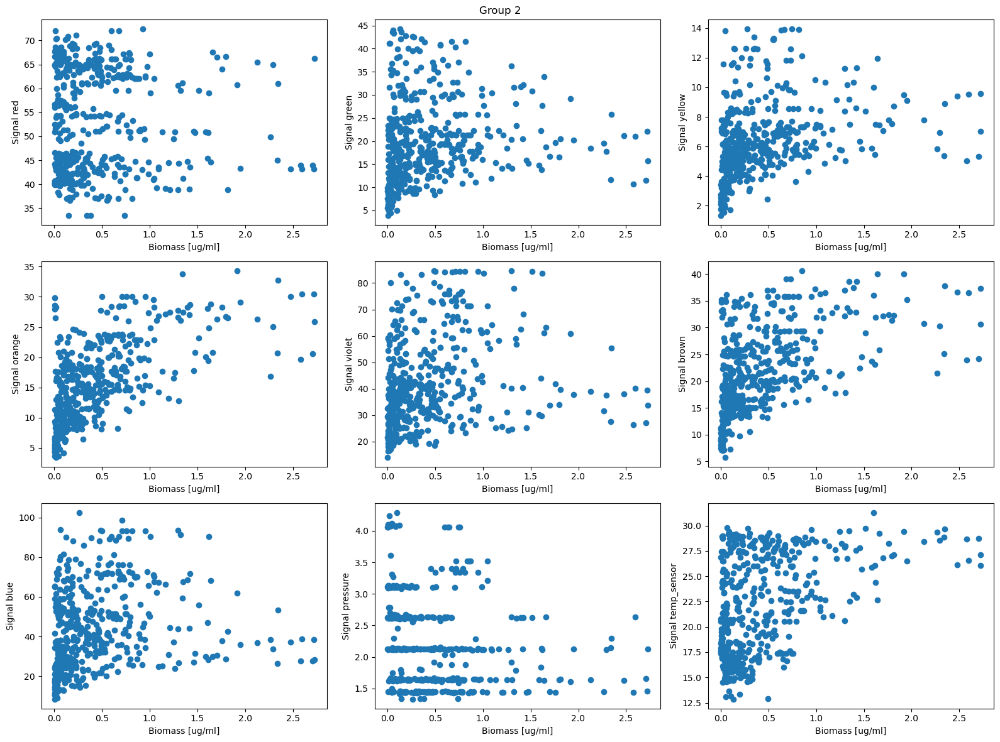

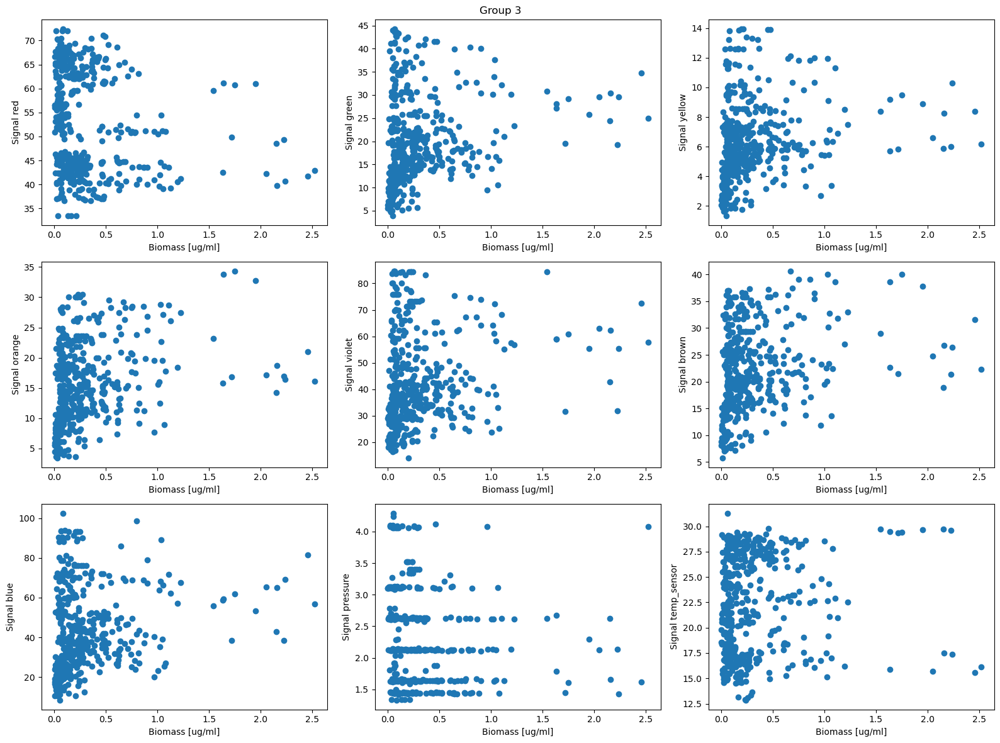

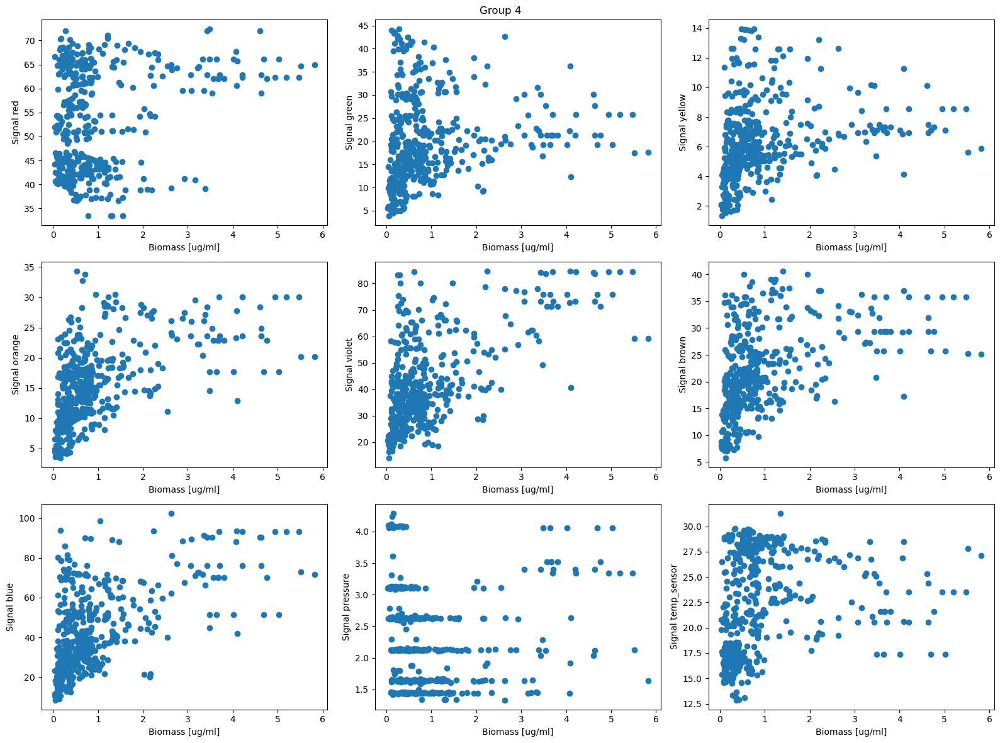

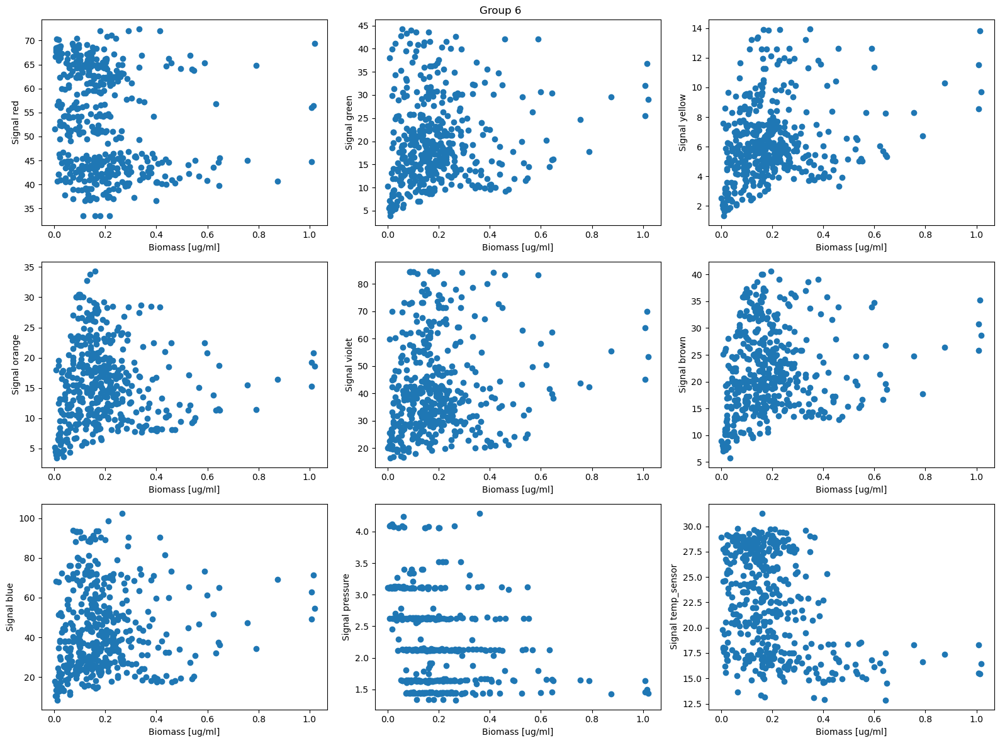

In [100]:
plot_corr_per_feature_per_group(merged_df, fluor_groups_map)

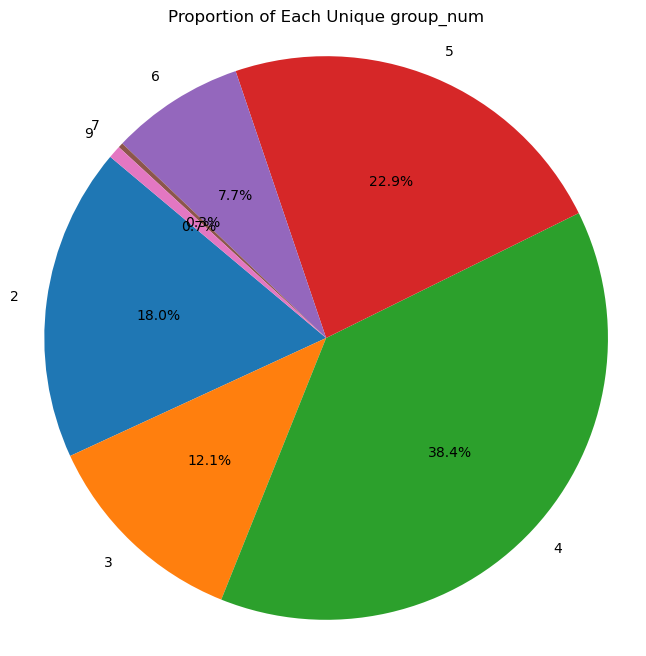

In [101]:
groups_pie_chart(merged_df, by_biomass=True)

In [104]:
group_order = [4, 5, 2, 3, 6, 9, 7]

In [102]:
merged_df = merged_df.drop(['year', 'Depth'], axis=1)
merged_df_test = merged_df_test.drop(['year', 'Depth'], axis=1)
fluor_test_df = fluor_test_df.drop('Depth', axis=1)

# Training models and evaluating

## Linear Regression

In [ ]:
regression_models_lr, preds_real_y_lr = train('lr', merged_df, test_size=0.2)

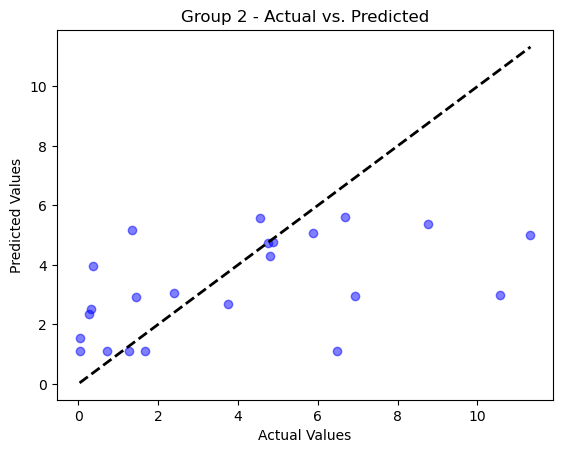

Results for group_num 2:
MSE: 8.713518128003356
R-squared: 0.2245963683018245



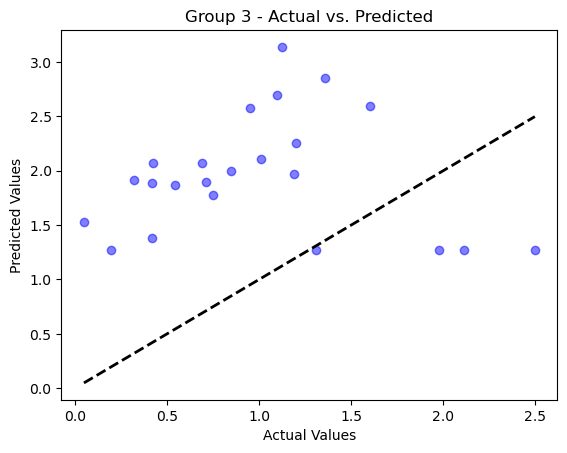

Results for group_num 3:
MSE: 1.6198500640956208
R-squared: -3.33063002726262



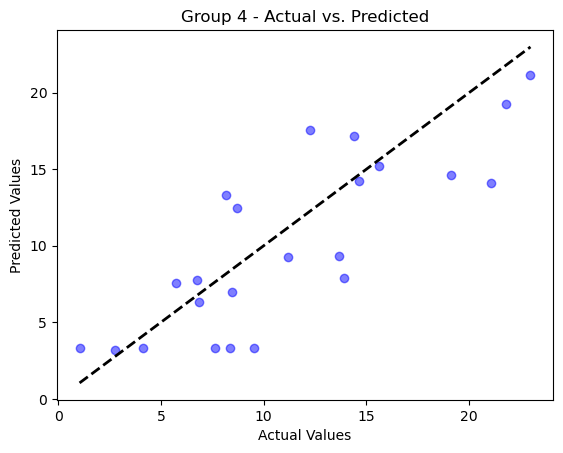

Results for group_num 4:
MSE: 13.476141014960046
R-squared: 0.6162552452429026



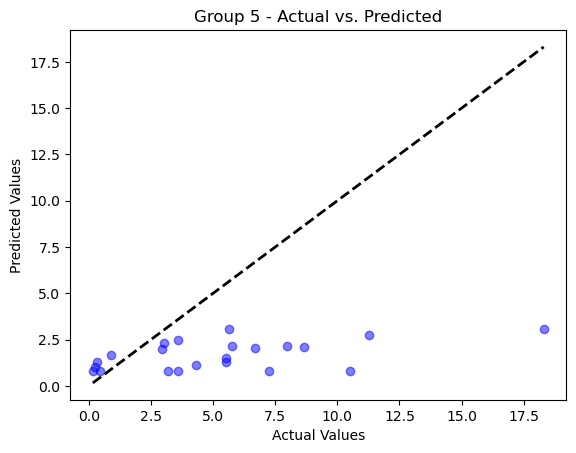

Results for group_num 5:
MSE: 28.233767563588227
R-squared: -0.5588905840515921



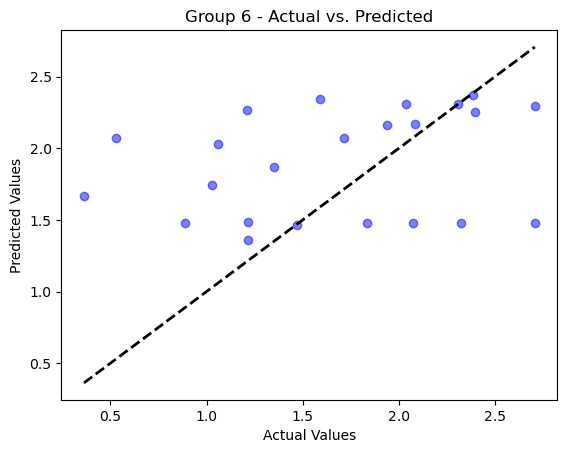

Results for group_num 6:
MSE: 0.4833098807283927
R-squared: -0.13495443729381384



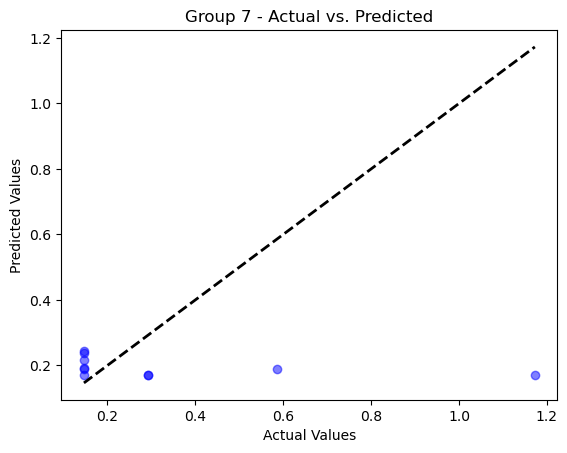

Results for group_num 7:
MSE: 0.12189764781091535
R-squared: -0.2443857862793284



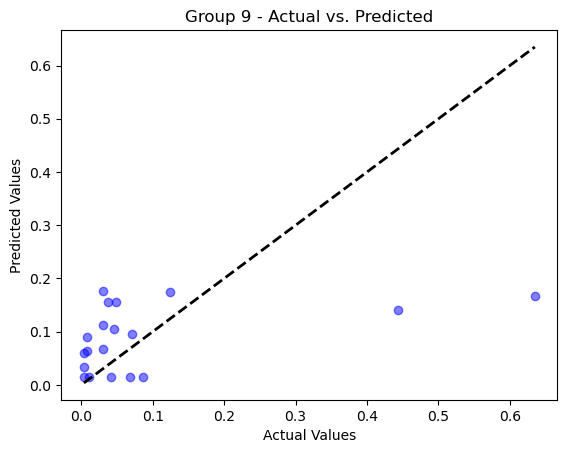

Results for group_num 9:
MSE: 0.02084902668252256
R-squared: 0.18463010450700412

Total MSE: 7.524190475124155, Total R-squared: -0.46333987383366043


In [52]:
eval_test(regression_models_lr, merged_df_test)

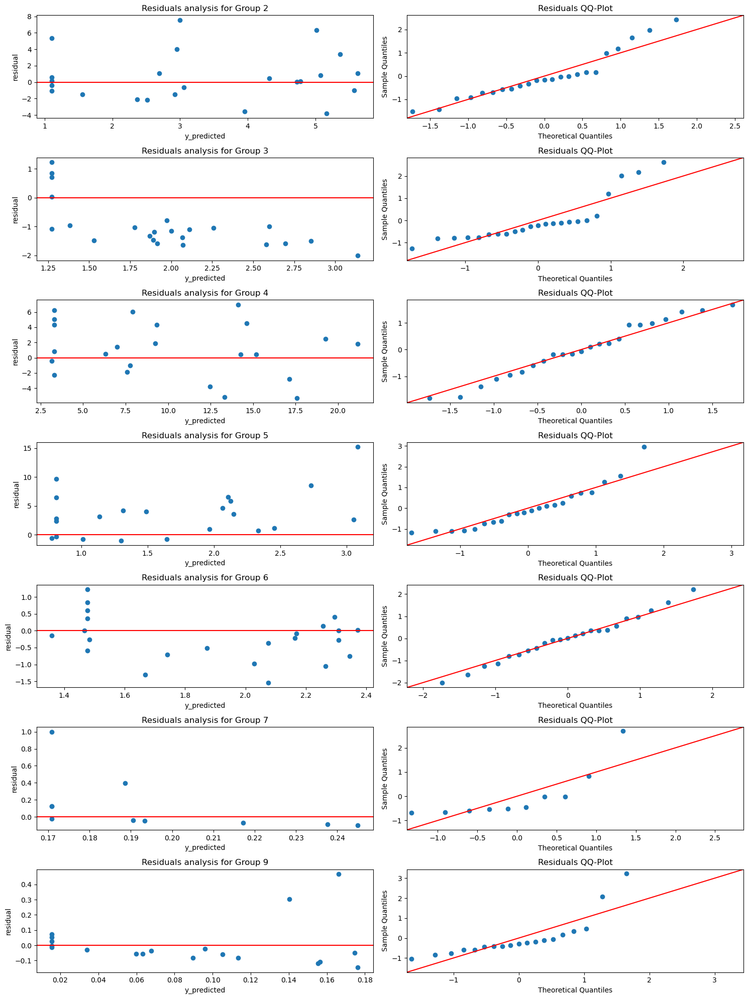

In [53]:
residual_analysis(merged_df_test, regression_models_lr)

## XGBoost

In [54]:
# keep_cols = merged_df.columns

In [55]:
# from sklearn.feature_selection import SelectKBest, f_regression
# selkbest= SelectKBest(f_regression, k=5)
# X_new = selkbest.fit_transform(merged_df.drop('sum_biomass_ug_ml', axis=1), merged_df['sum_biomass_ug_ml'])

In [56]:
# selkbest.get_feature_names_out()

In [57]:
# keep_cols = ['orange', 'brown', 'blue', 'Total conc', 'group_num', 'sum_biomass_ug_ml']

In [77]:
regression_models_xgboost, preds_real_y_xgboost = train('xgb', merged_df, test_size=0.0, biomass_factor=100)

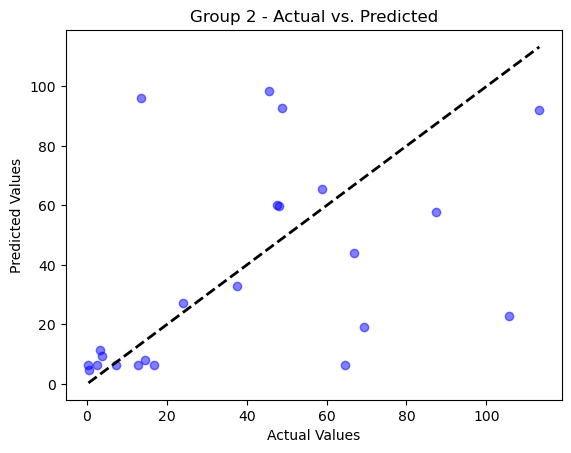

Results for group_num 2:
MSE: 1168.6380733598305
R-squared: -0.03995446260879376



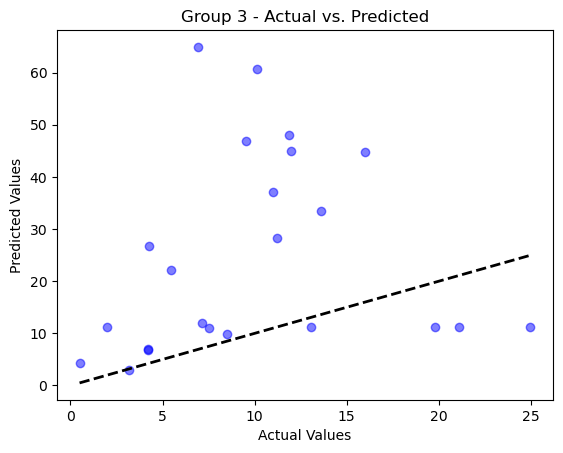

Results for group_num 3:
MSE: 574.9981573361531
R-squared: -14.372436875328164



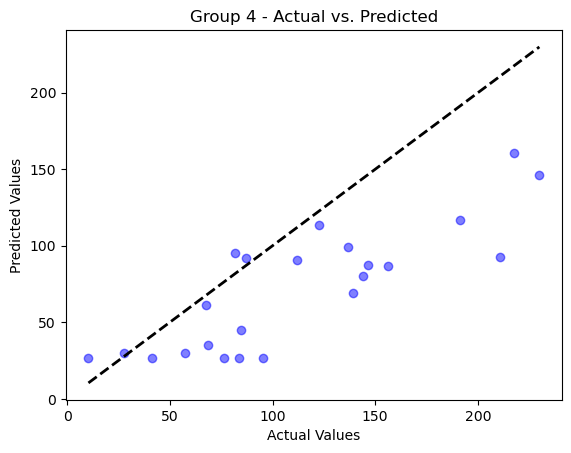

Results for group_num 4:
MSE: 2760.580519054198
R-squared: 0.21390085403850745



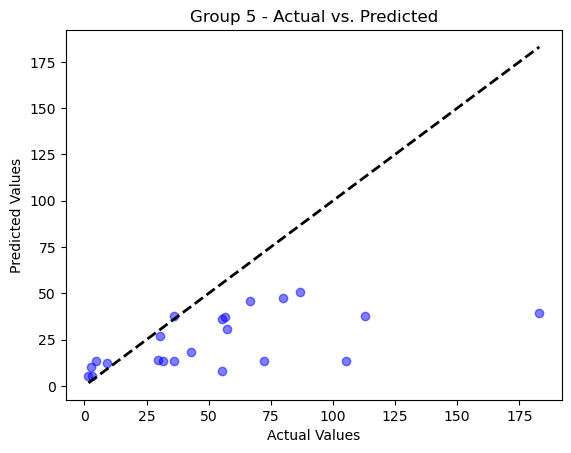

Results for group_num 5:
MSE: 2119.477849739308
R-squared: -0.1702420003363565



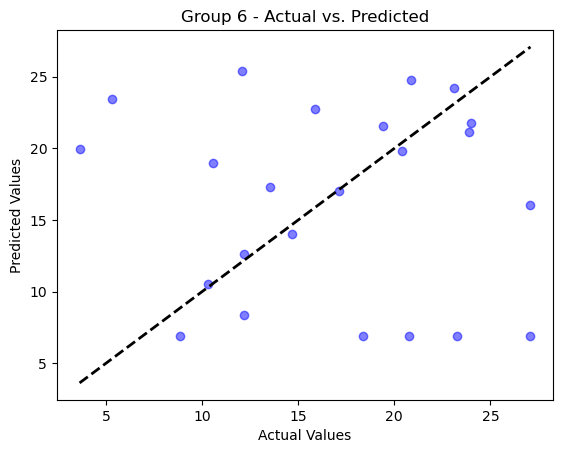

Results for group_num 6:
MSE: 90.43894350188464
R-squared: -1.123773676568217



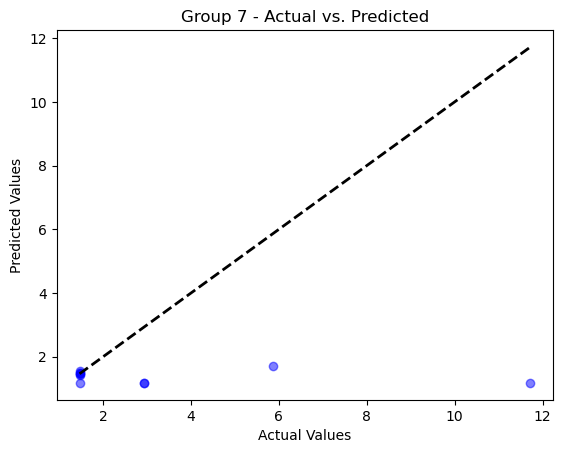

Results for group_num 7:
MSE: 13.462846401781329
R-squared: -0.3743476601964699



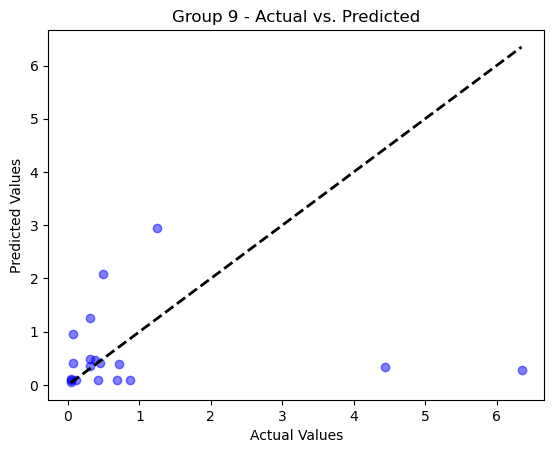

Results for group_num 9:
MSE: 3.2622545474470126
R-squared: -0.2758121469781678

Total MSE: 961.5512348486575, Total R-squared: -2.3060951382825228


In [78]:
eval_test(regression_models_xgboost, merged_df_test, biomass_factor=100)

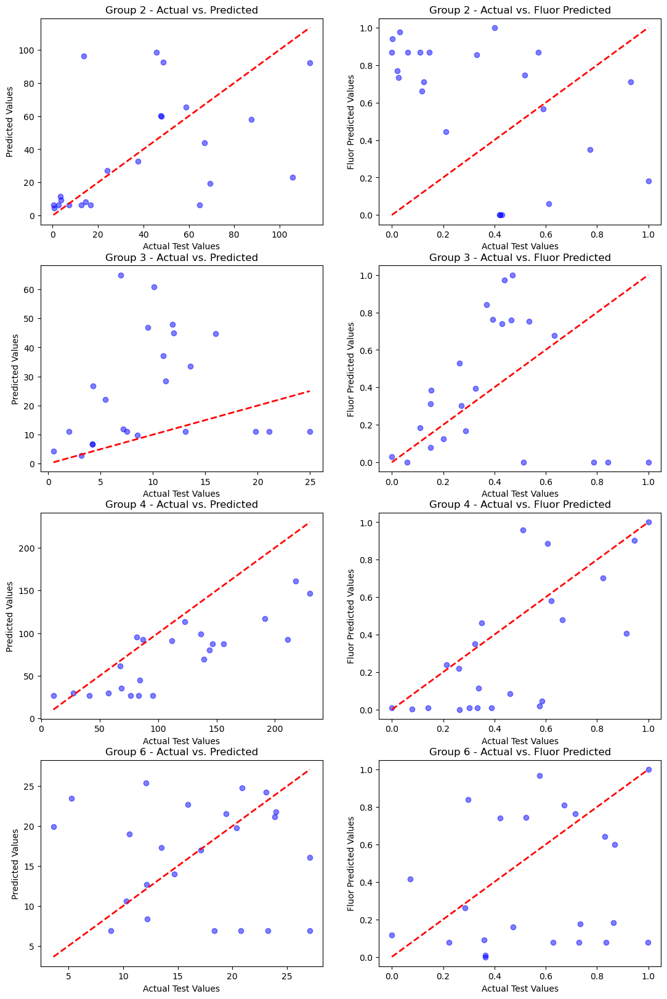

In [79]:
compare_to_fluor(regression_models_xgboost, merged_df_test, fluor_groups_map, fluor_test_df, biomass_factor=100)

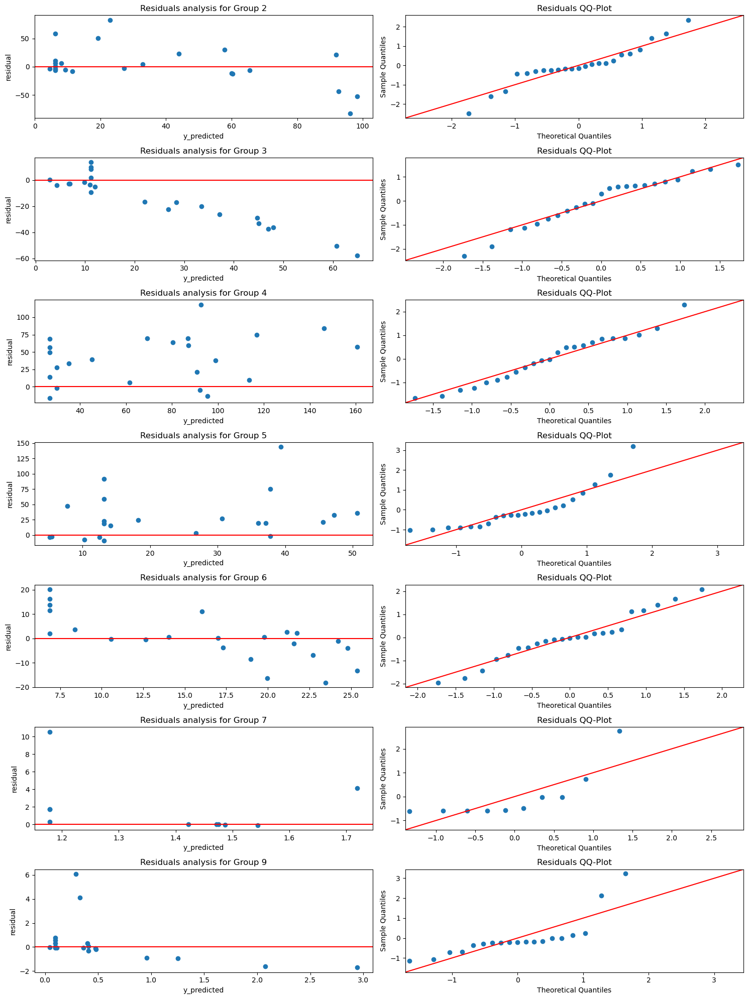

In [80]:
residual_analysis(merged_df_test, regression_models_xgboost, biomass_factor=100)

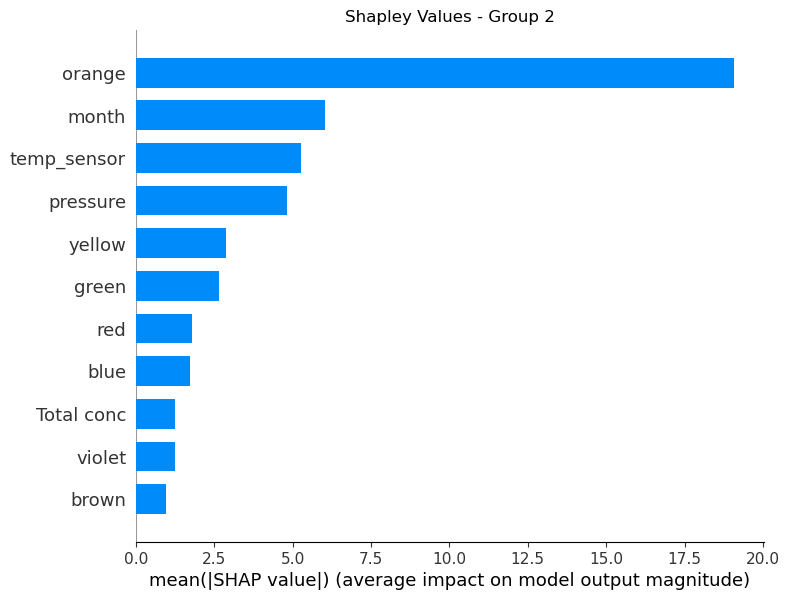

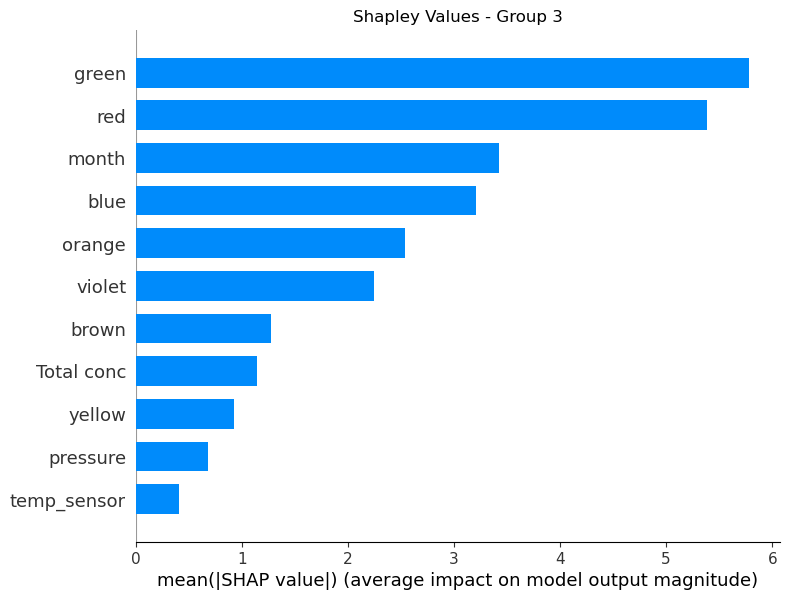

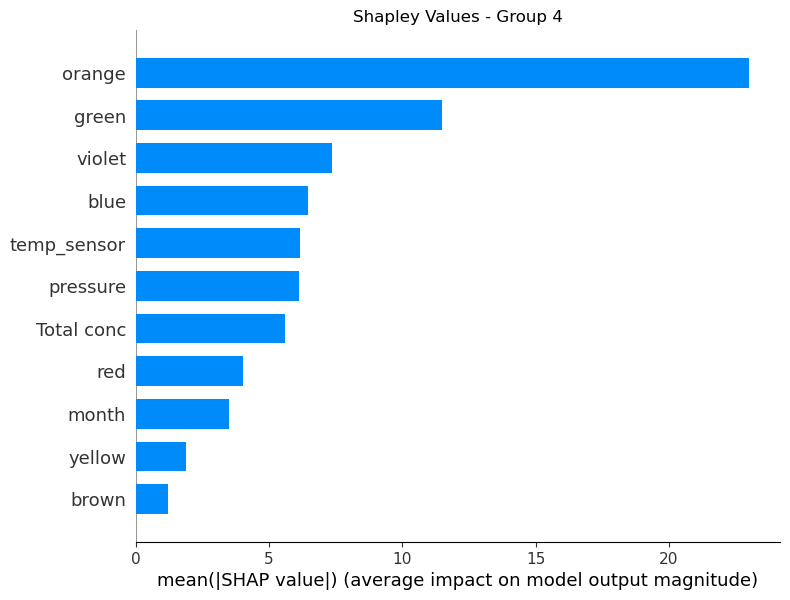

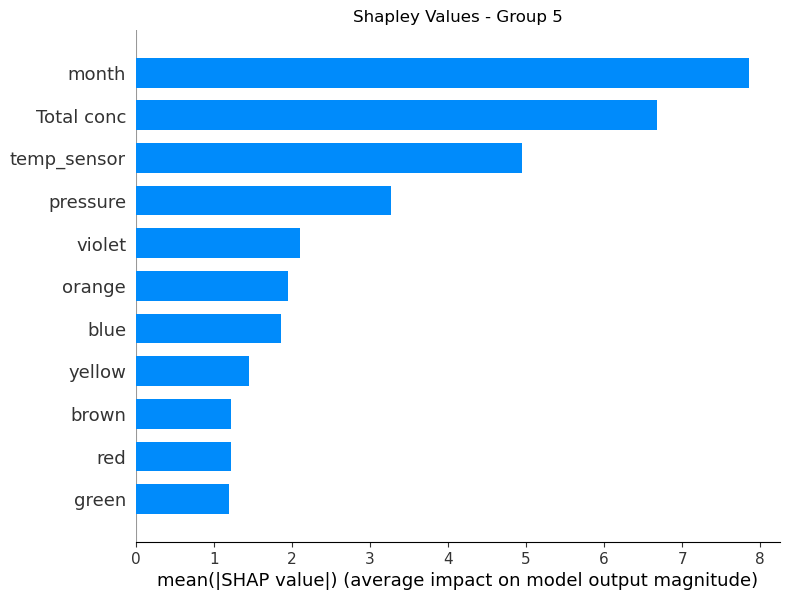

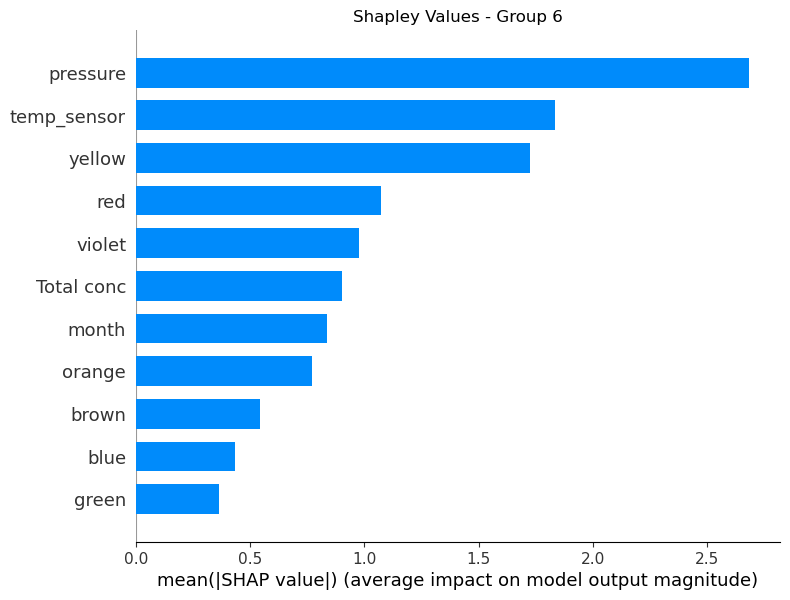

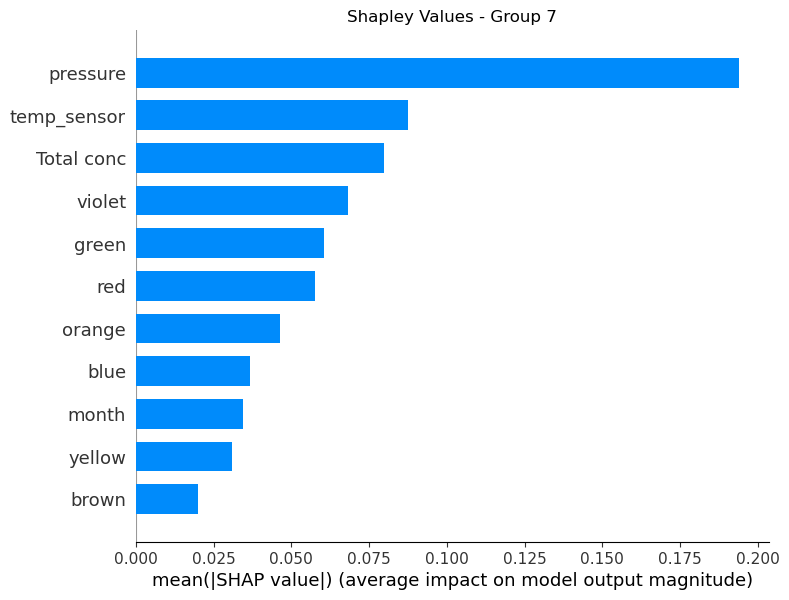

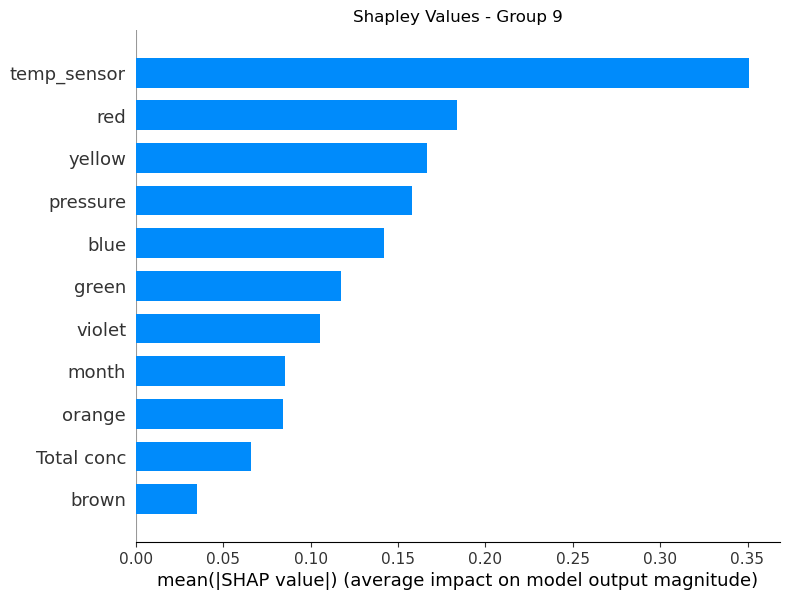

In [81]:
shap_values_list = plot_shap_values(merged_df_test, regression_models_xgboost, merged_df_test)

In [ ]:
features_list = merged_df_test.drop(['group_num', 'sum_biomass_ug_ml'], axis=1).columns.tolist()

# Create a DataFrame from the Shapley values
shap_df = pd.DataFrame({k: np.average(v, axis=0) for k, v in shap_values_list.items()}, index=features_list)

scaler = MinMaxScaler()
scaled_shap_df = pd.DataFrame(scaler.fit_transform(shap_df), columns=shap_df.columns, index=shap_df.index)
    
# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(scaled_shap_df.transpose(), cmap='coolwarm', annot=True, fmt=".2f")
plt.title("Shapley Values Heatmap")
plt.xlabel("Features")
plt.ylabel("Group Number")
plt.show()


### Train iteratively over previous predictions

In [105]:
regression_models_xgboost, preds_real_y_xgboost = train_iterative('xgb', merged_df, test_size=0.0, biomass_factor=100, group_order=group_order)

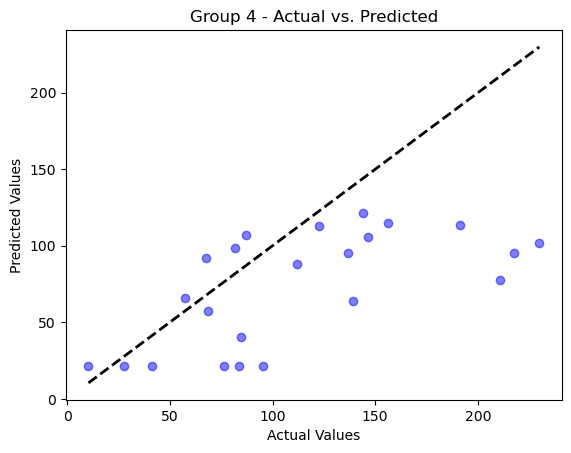

Results for group_num 4:
MSE: 3634.9626965133357
R-squared: -0.03508702304035838



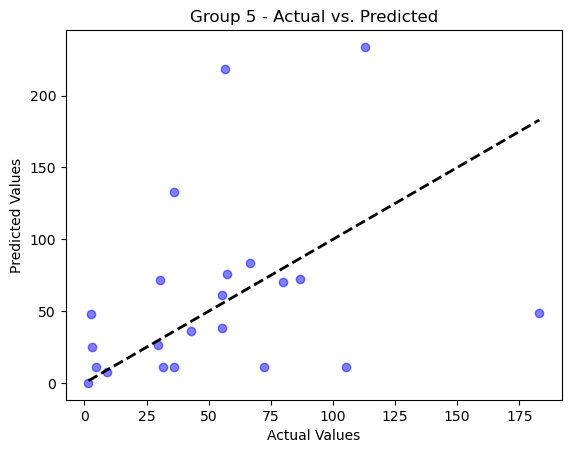

Results for group_num 5:
MSE: 3973.87354274733
R-squared: -1.1941223515595358



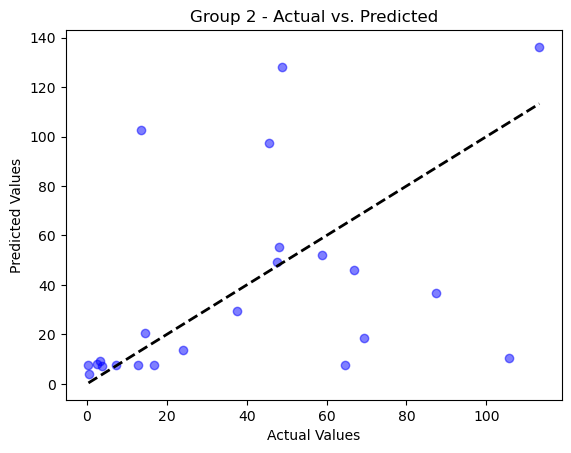

Results for group_num 2:
MSE: 1564.844099932984
R-squared: -0.39253259166345167



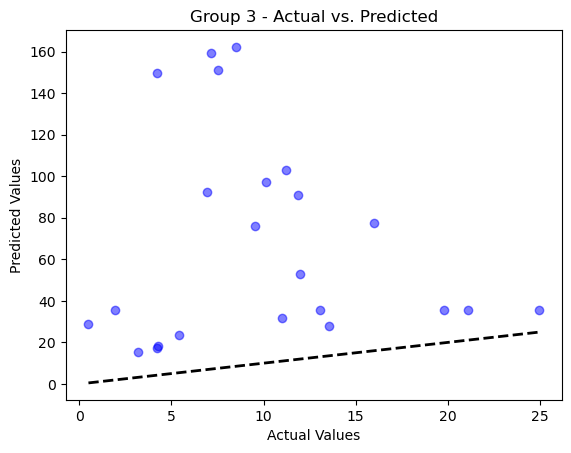

Results for group_num 3:
MSE: 5762.5517767220035
R-squared: -153.06043010444165



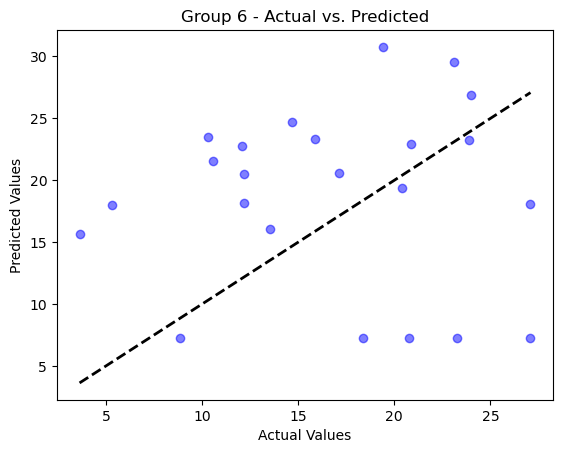

Results for group_num 6:
MSE: 96.4344207415277
R-squared: -1.2645652011812007



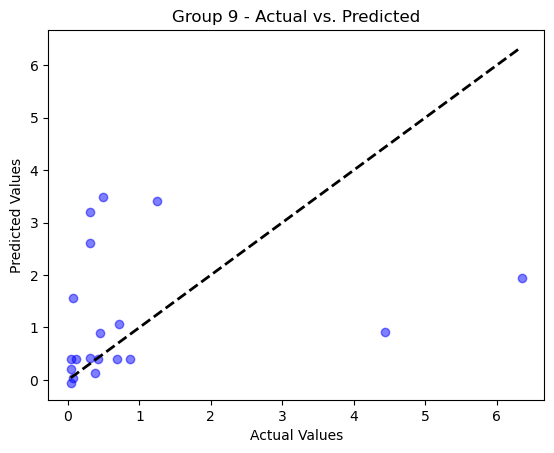

Results for group_num 9:
MSE: 3.2778374022712966
R-squared: -0.28190633588349945



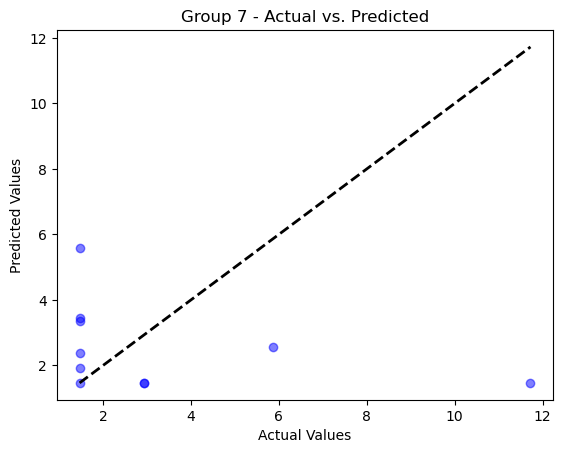

Results for group_num 7:
MSE: 14.565837275161282
R-squared: -0.4869459087991743

Total MSE: 2150.072887333516, Total R-squared: -22.387941359509842


In [106]:
eval_test_iterative(regression_models_xgboost, merged_df_test, biomass_factor=100, group_order=group_order)

### Grid Search

In [110]:
param_grid = {
    'model__n_estimators': [100, 300, 500, 1000],  # Number of boosting rounds
    'model__learning_rate': [0.01, 0.1, 0.2],  # Step size shrinkage
    'model__max_depth': [3, 6, 10],  # Maximum depth of a tree
    'model__min_child_weight': [1, 5, 7],  # Minimum sum of instance weight needed in a child
    'model__gamma': [0.1, 0.3, 0.6],  # Minimum loss reduction required to make a further partition
#     'reg_alpha': [0, 0.1, 0.5],  # L1 regularization term on weights
#     'reg_lambda': [0, 0.1, 0.5]  # L2 regularization term on weights
}

In [111]:
best_group_params = grid_search_cv('xgb', merged_df, param_grid=param_grid)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV 2/5; 1/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 2/5; 1/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.129 total time=   0.1s
[CV 1/5; 2/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 2/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.061 total time=   0.2s
[CV 5/5; 2/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 2/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.064 total time=   0.2s
[CV 4/5; 3/3

[CV 4/5; 1/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 4/5; 1/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.108 total time=   0.1s
[CV 4/5; 2/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 2/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.061 total time=   0.2s
[CV 3/5; 3/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 3/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.081 total time=   0.3s
[CV 2/5; 4/324] START model__gamma=0.1, model__learning_rate=0.01, model__ma

[CV 5/5; 22/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.074 total time=   0.3s
[CV 3/5; 23/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 23/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.075 total time=   0.5s
[CV 2/5; 24/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 24/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000;, score=-0.049 total time=   0.9s
[CV 1/5; 25/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 25/324] END model__gamma=0.1, model__learning_rate=0.01, m

[CV 2/5; 21/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.107 total time=   0.1s
[CV 4/5; 21/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 21/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.083 total time=   0.1s
[CV 2/5; 22/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 22/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.057 total time=   0.3s
[CV 4/5; 22/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 22/324] END model__gamma=0.1, model__learning_rate=0.01, mode

[CV 4/5; 37/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.051 total time=   0.1s
[CV 5/5; 37/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 37/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.053 total time=   0.1s
[CV 3/5; 38/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 38/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.078 total time=   0.2s
[CV 1/5; 39/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 39/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_

[CV 5/5; 43/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.052 total time=   0.3s
[CV 4/5; 44/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 44/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.055 total time=   0.5s
[CV 1/5; 46/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 46/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.052 total time=   0.2s
[CV 4/5; 46/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 46/324] END model__gamma=0.1, model__learning_rate=0.1, model__ma

[CV 1/5; 57/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 57/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.051 total time=   0.1s
[CV 3/5; 57/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 57/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.074 total time=   0.1s
[CV 5/5; 57/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 57/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.069 total time=   0.1s
[CV 3/5; 58/324] START model__gamma=0.1, model__learning_rate=0.1, model__ma

[CV 4/5; 68/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.040 total time=   1.5s
[CV 2/5; 70/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 70/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.049 total time=   0.4s
[CV 5/5; 70/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 70/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.071 total time=   0.5s
[CV 3/5; 71/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 71/324] END model__gamma=0.1, model__learning_rate=0.1, mode

[CV 2/5; 76/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.063 total time=   0.6s
[CV 1/5; 77/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 77/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.056 total time=   0.1s
[CV 2/5; 77/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 77/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.060 total time=   0.1s
[CV 4/5; 77/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 77/324] END model__gamma=0.1, model__learning_rate=0.2, model__max

[CV 1/5; 92/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.052 total time=   1.1s
[CV 2/5; 93/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 93/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.047 total time=   0.1s
[CV 4/5; 93/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 93/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.043 total time=   0.1s
[CV 1/5; 94/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 94/324] END model__gamma=0.1, model__learning_rate=0.2, model__max

[CV 1/5; 97/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 97/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.046 total time=   0.2s
[CV 3/5; 97/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 97/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.076 total time=   0.2s
[CV 1/5; 98/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 98/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.046 total time=   0.5s
[CV 5/5; 98/324] START model__gamma=0.1, model__learning_rate=0.2, mod

[CV 3/5; 109/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.164 total time=   0.1s
[CV 5/5; 109/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 109/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.110 total time=   0.1s
[CV 2/5; 110/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 110/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.067 total time=   0.2s
[CV 5/5; 110/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 110/324] END model__gamma=0.3, model__learning_rate=0.0

[CV 3/5; 115/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 115/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.087 total time=   0.3s
[CV 2/5; 116/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 116/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.074 total time=   0.6s
[CV 1/5; 117/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 117/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.088 total time=   0.1s
[CV 3/5; 117/324] START model__gamma=0.3, model__learning_rate

[CV 1/5; 133/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.068 total time=   0.2s
[CV 3/5; 133/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 133/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.139 total time=   0.2s
[CV 1/5; 134/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 134/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.053 total time=   0.5s
[CV 4/5; 134/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 134/324] END model__gamma=0.3, model__learning_ra

[CV 4/5; 137/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 137/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.084 total time=   0.1s
[CV 1/5; 138/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 138/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.057 total time=   0.4s
[CV 4/5; 138/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 138/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.052 total time=   0.4s
[CV 2/5; 139/324] START model__gamma=0.3, model__learning_

[CV 1/5; 154/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.065 total time=   0.2s
[CV 4/5; 154/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 154/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.067 total time=   0.2s
[CV 3/5; 155/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 155/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.092 total time=   0.3s
[CV 2/5; 156/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 156/324] END model__gamma=0.3, model__learning_rate=0.1, mod

[CV 5/5; 157/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 157/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.071 total time=   0.1s
[CV 3/5; 158/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 158/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.084 total time=   0.3s
[CV 1/5; 159/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 159/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.053 total time=   0.5s
[CV 5/5; 159/324] START model__gamma=0.3, model__learning_rate=0.1, mo

[CV 2/5; 172/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.060 total time=   1.8s
[CV 1/5; 173/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 173/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.057 total time=   0.2s
[CV 3/5; 173/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 173/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.086 total time=   0.2s
[CV 5/5; 173/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 5/5; 173/324] END model__gamma=0.3, model__learning_rate=0.

[CV 4/5; 184/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 184/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.061 total time=   0.6s
[CV 3/5; 186/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 186/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.081 total time=   0.2s
[CV 2/5; 187/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 2/5; 187/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.061 total time=   0.3s
[CV 1/5; 188/324] START model__gamma=0.3, model__learning_rate=0.2, 

[CV 1/5; 190/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.062 total time=   0.2s
[CV 4/5; 190/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 190/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.061 total time=   0.2s
[CV 3/5; 191/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 191/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.095 total time=   0.3s
[CV 2/5; 192/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 192/324] END model__gamma=0.3, model__learning_rate=0.2, mod

[CV 5/5; 208/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 5/5; 208/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.074 total time=   1.9s
[CV 4/5; 211/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 4/5; 211/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.052 total time=   0.8s
[CV 3/5; 212/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 212/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.080 total time=   1.6s
[CV 2/5; 213/324] START model__gamma=0.3, model__learning_ra

[CV 3/5; 211/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.080 total time=   0.8s
[CV 2/5; 212/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 212/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.064 total time=   1.5s
[CV 1/5; 213/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 213/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.056 total time=   0.2s
[CV 3/5; 213/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 213/324] END model__gamma=0.3, model__learning_rate=0

[CV 1/5; 229/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 229/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.077 total time=   0.1s
[CV 3/5; 229/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 229/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.139 total time=   0.1s
[CV 1/5; 230/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 230/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.062 total time=   0.4s
[CV 5/5; 230/324] START model__gamma=0.6, model__learning_rate=0

[CV 5/5; 235/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.078 total time=   0.5s
[CV 4/5; 236/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 236/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.062 total time=   1.1s
[CV 2/5; 238/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 238/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.075 total time=   0.3s
[CV 5/5; 238/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 238/324] END model__gamma=0.6, model__learning_rate=0

[CV 3/5; 250/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.100 total time=   0.4s
[CV 1/5; 251/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 251/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.065 total time=   0.7s
[CV 5/5; 251/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 5/5; 251/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.081 total time=   0.6s
[CV 4/5; 252/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 252/324] END model__gamma=0.6, model__learning_r

[CV 2/5; 251/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 2/5; 251/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.075 total time=   0.6s
[CV 1/5; 252/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 1/5; 252/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.065 total time=   1.4s
[CV 1/5; 253/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 253/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.065 total time=   0.1s
[CV 2/5; 253/324] START model__gamma=0.6, model__learning_ra

[CV 4/5; 269/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.062 total time=   0.1s
[CV 1/5; 270/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 270/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.065 total time=   0.3s
[CV 4/5; 270/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 270/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.062 total time=   0.3s
[CV 3/5; 271/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 271/324] END model__gamma=0.6, model__learning_rate=0.1, mode

[CV 2/5; 292/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.068 total time=   0.6s
[CV 1/5; 293/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 293/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.071 total time=   0.1s
[CV 2/5; 293/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 293/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.071 total time=   0.1s
[CV 4/5; 293/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 293/324] END model__gamma=0.6, model__learning_rate=0.2, mod

[CV 3/5; 293/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 293/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.092 total time=   0.1s
[CV 1/5; 294/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 294/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.071 total time=   0.2s
[CV 4/5; 294/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 294/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.065 total time=   0.2s
[CV 3/5; 295/324] START model__gamma=0.6, model__learning_rate=0.2, mo

[CV 1/5; 316/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.059 total time=   1.7s
[CV 5/5; 316/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 5/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.072 total time=   1.8s
[CV 2/5; 319/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 2/5; 319/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.073 total time=   0.8s
[CV 1/5; 320/324] START model__gamma=0.6, model__learning_ra

[CV 5/5; 314/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.072 total time=   0.5s
[CV 4/5; 315/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 4/5; 315/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.053 total time=   0.9s
[CV 2/5; 316/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.065 total time=   1.8s
[CV 1/5; 317/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 317/324] END model__gamma=0.6, model__learning_rate=0

[CV 1/5; 7/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.116 total time=   0.3s
[CV 2/5; 7/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 2/5; 7/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.121 total time=   0.3s
[CV 4/5; 8/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 8/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.063 total time=   0.6s
[CV 5/5; 8/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 8/324] END model__gamma=0.1, model__learning_rate=0.01, model__m

[CV 1/5; 14/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.107 total time=   0.3s
[CV 1/5; 15/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 15/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.106 total time=   0.6s
[CV 2/5; 15/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 2/5; 15/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.124 total time=   0.5s
[CV 4/5; 16/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 16/324] END model__gamma=0.1, model__learning_rate=0.01, mod

[CV 5/5; 27/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 5/5; 27/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.054 total time=   0.9s
[CV 4/5; 28/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 28/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.100 total time=   1.8s
[CV 3/5; 30/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 30/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.116 total time=   0.4s
[CV 1/5; 31/324] START model__gamma=0.1, model__learning_rate=

[CV 1/5; 43/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.115 total time=   0.3s
[CV 5/5; 43/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 43/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.070 total time=   0.3s
[CV 4/5; 44/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 44/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.072 total time=   0.6s
[CV 5/5; 45/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 45/324] END model__gamma=0.1, model__learning_rate=0.1, model__ma

[CV 3/5; 47/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 47/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.076 total time=   0.3s
[CV 2/5; 48/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 48/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.111 total time=   0.6s
[CV 1/5; 49/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 49/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.106 total time=   0.1s
[CV 3/5; 49/324] START model__gamma=0.1, model__learning_rate=0.1, model__

[CV 5/5; 62/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.056 total time=   0.6s
[CV 4/5; 63/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 4/5; 63/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.103 total time=   0.9s
[CV 3/5; 64/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 64/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.192 total time=   1.8s
[CV 1/5; 65/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 65/324] END model__gamma=0.1, model__learning_rate=0.1, mod

[CV 5/5; 67/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.069 total time=   0.8s
[CV 4/5; 68/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 68/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.104 total time=   1.5s
[CV 2/5; 70/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 70/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.126 total time=   0.4s
[CV 4/5; 70/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 70/324] END model__gamma=0.1, model__learning_rate=0.1, mod

[CV 4/5; 83/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.061 total time=   0.3s
[CV 3/5; 84/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 3/5; 84/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.079 total time=   0.6s
[CV 2/5; 85/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 2/5; 85/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.127 total time=   0.1s
[CV 4/5; 85/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 4/5; 85/324] END model__gamma=0.1, model__learning_rate=0.2, model__ma

[CV 2/5; 88/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.127 total time=   1.1s
[CV 1/5; 89/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 89/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.095 total time=   0.1s
[CV 3/5; 89/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 89/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.114 total time=   0.1s
[CV 5/5; 89/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 5/5; 89/324] END model__gamma=0.1, model__learning_rate=0.2, model__max

[CV 5/5; 105/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.068 total time=   0.1s
[CV 3/5; 106/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 106/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.086 total time=   0.4s
[CV 1/5; 107/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 107/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.104 total time=   0.7s
[CV 5/5; 107/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 5/5; 107/324] END model__gamma=0.1, model__learning_rate=0.2

[CV 3/5; 108/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.086 total time=   1.7s
[CV 5/5; 109/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 109/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.085 total time=   0.1s
[CV 2/5; 110/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 110/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.140 total time=   0.2s
[CV 5/5; 110/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 110/324] END model__gamma=0.3, model__learning_rate=0.

[CV 4/5; 124/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.097 total time=   1.2s
[CV 3/5; 126/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 126/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.111 total time=   0.4s
[CV 1/5; 127/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 1/5; 127/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.097 total time=   0.5s
[CV 5/5; 127/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 127/324] END model__gamma=0.3, model__learning_rate=0.

[CV 1/5; 128/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.097 total time=   1.0s
[CV 5/5; 128/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 128/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.081 total time=   1.0s
[CV 4/5; 131/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 4/5; 131/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.086 total time=   0.5s
[CV 3/5; 132/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 3/5; 132/324] END model__gamma=0.3, model__learning_rate

[CV 1/5; 150/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 150/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.117 total time=   0.2s
[CV 4/5; 150/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 150/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.073 total time=   0.2s
[CV 3/5; 151/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 151/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.122 total time=   0.3s
[CV 2/5; 152/324] START model__gamma=0.3, model__learning_rate=0.1, mo

[CV 4/5; 151/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.073 total time=   0.3s
[CV 3/5; 152/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 152/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.122 total time=   0.6s
[CV 2/5; 153/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 153/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.116 total time=   0.1s
[CV 4/5; 153/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 153/324] END model__gamma=0.3, model__learning_rate=0.1, mo

[CV 3/5; 169/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.182 total time=   0.2s
[CV 1/5; 170/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 170/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.090 total time=   0.6s
[CV 4/5; 170/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 170/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.091 total time=   0.5s
[CV 3/5; 171/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 171/324] END model__gamma=0.3, model__learning_rate=0.1

[CV 2/5; 183/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.122 total time=   0.3s
[CV 5/5; 183/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 5/5; 183/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.053 total time=   0.3s
[CV 3/5; 184/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 184/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.178 total time=   0.6s
[CV 3/5; 185/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 185/324] END model__gamma=0.3, model__learning_rate=0.2, mo

[CV 2/5; 190/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.125 total time=   0.2s
[CV 5/5; 190/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 190/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.082 total time=   0.2s
[CV 2/5; 191/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 2/5; 191/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.125 total time=   0.3s
[CV 1/5; 192/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 1/5; 192/324] END model__gamma=0.3, model__learning_rate=0.2, mod

[CV 5/5; 206/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.063 total time=   0.5s
[CV 4/5; 207/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 4/5; 207/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.105 total time=   0.9s
[CV 3/5; 208/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 208/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.179 total time=   1.7s
[CV 1/5; 209/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 209/324] END model__gamma=0.3, model__learning_rate=0

[CV 2/5; 213/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 213/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.154 total time=   0.1s
[CV 4/5; 213/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 213/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.085 total time=   0.2s
[CV 1/5; 214/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 214/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.110 total time=   0.4s
[CV 4/5; 214/324] START model__gamma=0.3, model__learning_rate=0

[CV 5/5; 222/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.090 total time=   0.2s
[CV 4/5; 223/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 4/5; 223/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.066 total time=   0.3s
[CV 3/5; 224/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 224/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.150 total time=   0.6s
[CV 1/5; 225/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 225/324] END model__gamma=0.6, model__learning_rate=0

[CV 1/5; 234/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 234/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.110 total time=   0.3s
[CV 4/5; 234/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 234/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.090 total time=   0.3s
[CV 3/5; 235/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 235/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.110 total time=   0.5s
[CV 2/5; 236/324] START model__gamma=0.6, model__learning_rate=0

[CV 1/5; 245/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.126 total time=   0.1s
[CV 3/5; 245/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 245/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.117 total time=   0.2s
[CV 5/5; 245/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 5/5; 245/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.102 total time=   0.2s
[CV 2/5; 246/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 246/324] END model__gamma=0.6, model__learning_ra

[CV 5/5; 252/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 5/5; 252/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.090 total time=   1.3s
[CV 3/5; 256/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 256/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.180 total time=   0.6s
[CV 2/5; 257/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 257/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.137 total time=   0.1s
[CV 5/5; 257/324] START model__gamma=0.6, model__learning_rate

[CV 5/5; 264/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.093 total time=   0.6s
[CV 4/5; 266/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 266/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.090 total time=   0.4s
[CV 3/5; 267/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 267/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.172 total time=   0.6s
[CV 2/5; 268/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 268/324] END model__gamma=0.6, model__learning_rate=0.1, mo

[CV 4/5; 277/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.094 total time=   0.2s
[CV 2/5; 278/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 278/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.140 total time=   0.6s
[CV 5/5; 278/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 278/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.068 total time=   0.5s
[CV 4/5; 279/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 4/5; 279/324] END model__gamma=0.6, model__learning_rate=0.1

[CV 2/5; 285/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.153 total time=   0.1s
[CV 4/5; 285/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 285/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.080 total time=   0.1s
[CV 2/5; 286/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 286/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.153 total time=   0.4s
[CV 5/5; 286/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 286/324] END model__gamma=0.6, model__learning_rate=0.1

[CV 1/5; 299/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.128 total time=   0.3s
[CV 5/5; 299/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 5/5; 299/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.092 total time=   0.3s
[CV 4/5; 300/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 300/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.068 total time=   0.6s
[CV 5/5; 301/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 301/324] END model__gamma=0.6, model__learning_rate=0.2, mo

[CV 4/5; 301/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.101 total time=   0.2s
[CV 3/5; 302/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 302/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.168 total time=   0.4s
[CV 4/5; 302/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 302/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.101 total time=   0.4s
[CV 3/5; 303/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 303/324] END model__gamma=0.6, model__learning_rate=0.2, mode

[CV 4/5; 320/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.098 total time=   1.5s
[CV 3/5; 322/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 322/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.094 total time=   0.4s
[CV 1/5; 323/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 323/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.122 total time=   0.7s
[CV 5/5; 323/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 5/5; 323/324] END model__gamma=0.6, model__learning_rate=0.

[CV 2/5; 321/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 321/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.143 total time=   0.1s
[CV 4/5; 321/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 321/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.089 total time=   0.1s
[CV 2/5; 322/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 322/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.143 total time=   0.4s
[CV 4/5; 322/324] START model__gamma=0.6, model__learning_rate=0

[CV 4/5; 13/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.619 total time=   0.1s
[CV 2/5; 14/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 14/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.734 total time=   0.4s
[CV 3/5; 14/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 14/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.397 total time=   0.3s
[CV 5/5; 15/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 5/5; 15/324] END model__gamma=0.1, model__learning_rate=0.01, mode

[CV 5/5; 22/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 22/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.116 total time=   0.3s
[CV 3/5; 23/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 23/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.290 total time=   0.5s
[CV 2/5; 24/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 24/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000;, score=-0.506 total time=   1.0s
[CV 1/5; 25/324] START model__gamma=0.1, model__learning_rate=0.01, 

[CV 4/5; 39/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.242 total time=   0.3s
[CV 2/5; 40/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 40/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.500 total time=   0.6s
[CV 1/5; 41/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 41/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.149 total time=   0.1s
[CV 2/5; 41/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 41/324] END model__gamma=0.1, model__learning_rate=0.1, model__ma

[CV 3/5; 41/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 41/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.298 total time=   0.1s
[CV 5/5; 41/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 5/5; 41/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.119 total time=   0.1s
[CV 2/5; 42/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 42/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.464 total time=   0.2s
[CV 1/5; 43/324] START model__gamma=0.1, model__learning_rate=0.1, model__ma

[CV 4/5; 60/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000;, score=-0.243 total time=   1.0s
[CV 3/5; 61/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 61/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.338 total time=   0.2s
[CV 1/5; 62/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 62/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.140 total time=   0.6s
[CV 2/5; 63/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 2/5; 63/324] END model__gamma=0.1, model__learning_rate=0.1, model

[CV 4/5; 64/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.246 total time=   1.9s
[CV 2/5; 66/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 66/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.626 total time=   0.5s
[CV 5/5; 66/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 5/5; 66/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.117 total time=   0.5s
[CV 4/5; 67/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 4/5; 67/324] END model__gamma=0.1, model__learning_rate=0.1, mode

[CV 5/5; 79/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.124 total time=   0.3s
[CV 4/5; 80/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 80/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.252 total time=   0.6s
[CV 1/5; 82/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 82/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.139 total time=   0.2s
[CV 4/5; 82/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 82/324] END model__gamma=0.1, model__learning_rate=0.2, model__ma

[CV 1/5; 80/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.161 total time=   0.6s
[CV 5/5; 80/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 80/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.124 total time=   0.6s
[CV 2/5; 83/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 2/5; 83/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.358 total time=   0.3s
[CV 1/5; 84/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 1/5; 84/324] END model__gamma=0.1, model__learning_rate=0.2, model__

[CV 5/5; 101/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.112 total time=   0.2s
[CV 3/5; 102/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 102/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.292 total time=   0.5s
[CV 1/5; 103/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 1/5; 103/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.167 total time=   0.7s
[CV 5/5; 103/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 103/324] END model__gamma=0.1, model__learning_rate=0.2

[CV 5/5; 99/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.155 total time=   0.9s
[CV 4/5; 100/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 100/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.226 total time=   1.9s
[CV 2/5; 102/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 102/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.613 total time=   0.4s
[CV 5/5; 102/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 5/5; 102/324] END model__gamma=0.1, model__learning_rate=0.

[CV 2/5; 120/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.420 total time=   0.6s
[CV 5/5; 120/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 5/5; 120/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.133 total time=   0.6s
[CV 4/5; 122/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 122/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.282 total time=   0.4s
[CV 3/5; 123/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 123/324] END model__gamma=0.3, model__learning_rate=

[CV 2/5; 127/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.594 total time=   0.5s
[CV 1/5; 128/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 1/5; 128/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.136 total time=   1.0s
[CV 5/5; 128/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 128/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.120 total time=   1.0s
[CV 4/5; 131/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 4/5; 131/324] END model__gamma=0.3, model__learning_rate

[CV 3/5; 142/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.347 total time=   0.4s
[CV 1/5; 143/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 143/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.147 total time=   0.7s
[CV 5/5; 143/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 5/5; 143/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.118 total time=   0.7s
[CV 4/5; 144/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 144/324] END model__gamma=0.3, model__learning_r

[CV 5/5; 144/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.119 total time=   1.4s
[CV 4/5; 148/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 148/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.255 total time=   0.6s
[CV 3/5; 150/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 150/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.337 total time=   0.2s
[CV 2/5; 151/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 2/5; 151/324] END model__gamma=0.3, model__learning_rate=0.1,

[CV 5/5; 165/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.107 total time=   0.1s
[CV 2/5; 166/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 166/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.521 total time=   0.3s
[CV 5/5; 166/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 166/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.107 total time=   0.3s
[CV 3/5; 167/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 167/324] END model__gamma=0.3, model__learning_rate=0.1, mode

[CV 4/5; 170/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.248 total time=   0.6s
[CV 3/5; 171/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 171/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.367 total time=   0.9s
[CV 2/5; 172/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 172/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.809 total time=   1.8s
[CV 1/5; 173/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 173/324] END model__gamma=0.3, model__learning_rate=0

[CV 5/5; 185/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.127 total time=   0.1s
[CV 3/5; 186/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 186/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.350 total time=   0.2s
[CV 2/5; 187/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 2/5; 187/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.471 total time=   0.3s
[CV 1/5; 188/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 1/5; 188/324] END model__gamma=0.3, model__learning_rate=0.2, mod

[CV 4/5; 185/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.262 total time=   0.1s
[CV 2/5; 186/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 186/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.471 total time=   0.2s
[CV 1/5; 187/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 1/5; 187/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.163 total time=   0.3s
[CV 5/5; 187/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 187/324] END model__gamma=0.3, model__learning_rate=0.2, mode

[CV 3/5; 205/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.377 total time=   0.2s
[CV 1/5; 206/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 206/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.140 total time=   0.6s
[CV 1/5; 207/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 207/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.140 total time=   1.0s
[CV 1/5; 208/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 208/324] END model__gamma=0.3, model__learning_rate=0.

[CV 4/5; 224/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.328 total time=   0.6s
[CV 1/5; 226/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 226/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.171 total time=   0.2s
[CV 4/5; 226/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 226/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.385 total time=   0.2s
[CV 3/5; 227/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 227/324] END model__gamma=0.6, model__learning_rate=0.

[CV 1/5; 225/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.361 total time=   0.1s
[CV 3/5; 225/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 225/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.797 total time=   0.1s
[CV 5/5; 225/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 225/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.331 total time=   0.1s
[CV 3/5; 226/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 226/324] END model__gamma=0.6, model__learning_rate=0.0

[CV 2/5; 248/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.584 total time=   1.5s
[CV 2/5; 249/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 249/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.627 total time=   0.1s
[CV 3/5; 249/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 249/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.699 total time=   0.1s
[CV 5/5; 249/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 249/324] END model__gamma=0.6, model__learning_r

[CV 2/5; 243/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.768 total time=   0.9s
[CV 1/5; 244/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 244/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.130 total time=   1.8s
[CV 5/5; 244/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 5/5; 244/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.128 total time=   1.8s
[CV 4/5; 247/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 4/5; 247/324] END model__gamma=0.6, model__learnin

[CV 5/5; 267/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.119 total time=   0.6s
[CV 4/5; 268/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 268/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.275 total time=   1.1s
[CV 1/5; 270/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 270/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.147 total time=   0.3s
[CV 4/5; 270/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 270/324] END model__gamma=0.6, model__learning_rate=0.1, mo

[CV 2/5; 267/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.755 total time=   0.6s
[CV 1/5; 268/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 268/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.132 total time=   1.1s
[CV 5/5; 268/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 5/5; 268/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.119 total time=   1.1s
[CV 2/5; 271/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 2/5; 271/324] END model__gamma=0.6, model__learning_rate=0.1, 

[CV 1/5; 287/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.152 total time=   0.7s
[CV 5/5; 287/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 5/5; 287/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.130 total time=   0.7s
[CV 4/5; 288/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 288/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.295 total time=   1.4s
[CV 3/5; 290/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 290/324] END model__gamma=0.6, model__learning_rate=0.

[CV 5/5; 293/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.115 total time=   0.1s
[CV 3/5; 294/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 294/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.405 total time=   0.2s
[CV 1/5; 295/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 1/5; 295/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.168 total time=   0.3s
[CV 5/5; 295/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 295/324] END model__gamma=0.6, model__learning_rate=0.2, mode

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV 2/5; 305/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.556 total time=   0.1s
[CV 4/5; 305/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 305/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.316 total time=   0.1s
[CV 2/5; 306/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 306/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.556 total time=   0.3s
[CV 1/5; 307/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 1/

[CV 5/5; 315/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.118 total time=   0.9s
[CV 4/5; 316/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.290 total time=   1.8s
[CV 1/5; 318/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 318/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.174 total time=   0.5s
[CV 4/5; 318/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 318/324] END model__gamma=0.6, model__learning_rate=0

[CV 2/5; 2/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-2.452 total time=   0.2s
[CV 5/5; 3/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 5/5; 3/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.611 total time=   0.3s
[CV 1/5; 4/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 4/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.797 total time=   0.6s
[CV 2/5; 6/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 6/324] END model__gamma=0.1, model__learning_rate=0.01, model__ma

[CV 1/5; 8/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.782 total time=   0.6s
[CV 2/5; 10/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 10/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-2.584 total time=   0.2s
[CV 3/5; 10/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 10/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-1.520 total time=   0.2s
[CV 1/5; 11/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 11/324] END model__gamma=0.1, model__learning_rate=0.01, mode

[CV 4/5; 23/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.518 total time=   0.7s
[CV 1/5; 25/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 25/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.550 total time=   0.2s
[CV 2/5; 25/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 2/5; 25/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-3.488 total time=   0.2s
[CV 3/5; 25/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 25/324] END model__gamma=0.1, model__learning_rate=0.01,

[CV 5/5; 27/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.693 total time=   0.8s
[CV 4/5; 28/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 28/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.554 total time=   1.6s
[CV 3/5; 30/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 30/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-1.486 total time=   0.4s
[CV 1/5; 31/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 1/5; 31/324] END model__gamma=0.1, model__learning_rate=0.

[CV 5/5; 40/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.507 total time=   0.6s
[CV 4/5; 42/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 42/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.510 total time=   0.2s
[CV 3/5; 43/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 43/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-1.768 total time=   0.3s
[CV 2/5; 44/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 44/324] END model__gamma=0.1, model__learning_rate=0.1, model__ma

[CV 4/5; 57/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 57/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.494 total time=   0.1s
[CV 1/5; 58/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 58/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.591 total time=   0.3s
[CV 4/5; 58/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 58/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.498 total time=   0.3s
[CV 2/5; 59/324] START model__gamma=0.1, model__learning_rate=0.1, model__ma

[CV 4/5; 65/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.410 total time=   0.1s
[CV 1/5; 66/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 66/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-1.142 total time=   0.4s
[CV 4/5; 66/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 66/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.410 total time=   0.4s
[CV 3/5; 67/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 67/324] END model__gamma=0.1, model__learning_rate=0.1, model

[CV 3/5; 76/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-1.791 total time=   0.5s
[CV 2/5; 77/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 77/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-2.026 total time=   0.1s
[CV 4/5; 77/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 77/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.517 total time=   0.1s
[CV 1/5; 78/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 78/324] END model__gamma=0.1, model__learning_rate=0.2, model__max

[CV 5/5; 83/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.623 total time=   0.3s
[CV 4/5; 84/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 84/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.487 total time=   0.5s
[CV 5/5; 85/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 85/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.725 total time=   0.1s
[CV 3/5; 86/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 86/324] END model__gamma=0.1, model__learning_rate=0.2, model__ma

[CV 1/5; 98/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-1.380 total time=   0.5s
[CV 4/5; 98/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 98/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.526 total time=   0.5s
[CV 3/5; 99/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 99/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-1.168 total time=   0.8s
[CV 2/5; 100/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 100/324] END model__gamma=0.1, model__learning_rate=0.2, mo

[CV 3/5; 108/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-1.647 total time=   1.3s
[CV 1/5; 109/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 109/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-1.109 total time=   0.1s
[CV 3/5; 109/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 109/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-1.525 total time=   0.1s
[CV 5/5; 109/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 109/324] END model__gamma=0.3, model__learning_rate=0.

[CV 4/5; 114/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.514 total time=   0.2s
[CV 3/5; 115/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 115/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-1.695 total time=   0.3s
[CV 2/5; 116/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 116/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-2.123 total time=   0.6s
[CV 1/5; 117/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 117/324] END model__gamma=0.3, model__learning_rate=0

[CV 1/5; 129/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.612 total time=   0.1s
[CV 3/5; 129/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 129/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-1.428 total time=   0.1s
[CV 5/5; 129/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 129/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.754 total time=   0.1s
[CV 3/5; 130/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 130/324] END model__gamma=0.3, model__learning_rate=0.0

[CV 4/5; 139/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 4/5; 139/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.407 total time=   0.7s
[CV 3/5; 140/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 140/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-1.630 total time=   1.3s
[CV 3/5; 141/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 141/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-1.428 total time=   0.1s
[CV 5/5; 141/324] START model__gamma=0.3, model__learnin

[CV 1/5; 151/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.794 total time=   0.3s
[CV 5/5; 151/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 151/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.570 total time=   0.3s
[CV 4/5; 152/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 152/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.455 total time=   0.5s
[CV 1/5; 154/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 154/324] END model__gamma=0.3, model__learning_rate=0.1, mo

[CV 4/5; 164/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 164/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.436 total time=   0.9s
[CV 2/5; 166/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 166/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-2.697 total time=   0.3s
[CV 5/5; 166/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 166/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.722 total time=   0.3s
[CV 3/5; 167/324] START model__gamma=0.3, model__learning_rate=0.1, 

[CV 5/5; 169/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.740 total time=   0.2s
[CV 3/5; 170/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 170/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-1.255 total time=   0.5s
[CV 2/5; 171/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 2/5; 171/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-3.090 total time=   0.8s
[CV 1/5; 172/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 172/324] END model__gamma=0.3, model__learning_rate=0.

[CV 4/5; 182/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 182/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.447 total time=   0.2s
[CV 2/5; 183/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 2/5; 183/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-2.240 total time=   0.3s
[CV 5/5; 183/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 5/5; 183/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.551 total time=   0.3s
[CV 3/5; 184/324] START model__gamma=0.3, model__learning_rate=0.2, mo

[CV 4/5; 193/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.488 total time=   0.1s
[CV 2/5; 194/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 194/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-2.689 total time=   0.3s
[CV 1/5; 195/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 195/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-1.201 total time=   0.5s
[CV 5/5; 195/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 5/5; 195/324] END model__gamma=0.3, model__learning_rate=0.2, mode

[CV 1/5; 212/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.882 total time=   1.4s
[CV 5/5; 212/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 212/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.637 total time=   1.4s
[CV 4/5; 215/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 4/5; 215/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.454 total time=   0.7s
[CV 3/5; 216/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 3/5; 216/324] END model__gamma=0.3, model__learning_rate

[CV 5/5; 217/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 217/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.871 total time=   0.1s
[CV 3/5; 218/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 218/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-1.515 total time=   0.2s
[CV 5/5; 218/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 218/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.674 total time=   0.2s
[CV 3/5; 219/324] START model__gamma=0.6, model__learning_rate=0

[CV 1/5; 234/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.870 total time=   0.3s
[CV 4/5; 234/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 234/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.425 total time=   0.3s
[CV 3/5; 235/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 235/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-1.648 total time=   0.5s
[CV 2/5; 236/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 236/324] END model__gamma=0.6, model__learning_rate=0.

[CV 4/5; 257/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.451 total time=   0.1s
[CV 1/5; 258/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 258/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.739 total time=   0.2s
[CV 4/5; 258/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 258/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.451 total time=   0.2s
[CV 3/5; 259/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 259/324] END model__gamma=0.6, model__learning_rate=0.1, mode

[CV 2/5; 257/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-2.232 total time=   0.1s
[CV 3/5; 257/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 257/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-1.649 total time=   0.1s
[CV 5/5; 257/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 5/5; 257/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.580 total time=   0.1s
[CV 3/5; 258/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 258/324] END model__gamma=0.6, model__learning_rate=0.1, mode

[CV 2/5; 277/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-3.046 total time=   0.2s
[CV 5/5; 277/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 277/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.764 total time=   0.2s
[CV 3/5; 278/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 278/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-1.319 total time=   0.5s
[CV 2/5; 279/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 2/5; 279/324] END model__gamma=0.6, model__learning_rate=0.1

[CV 1/5; 281/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-1.078 total time=   0.1s
[CV 3/5; 281/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 281/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-1.636 total time=   0.1s
[CV 5/5; 281/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 5/5; 281/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.729 total time=   0.1s
[CV 3/5; 282/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 282/324] END model__gamma=0.6, model__learning_rate=0.1

[CV 2/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-2.163 total time=   0.1s
[CV 4/5; 297/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.455 total time=   0.1s
[CV 1/5; 298/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 298/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.517 total time=   0.2s
[CV 4/5; 298/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 298/324] END model__gamma=0.6, model__learning_rate=0.2, mode

[CV 3/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-1.654 total time=   0.1s
[CV 5/5; 297/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.560 total time=   0.1s
[CV 3/5; 298/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 298/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-1.654 total time=   0.2s
[CV 1/5; 299/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 299/324] END model__gamma=0.6, model__learning_rate=0.2, mode

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV 2/5; 321/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-2.171 total time=   0.1s
[CV 4/5; 321/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 321/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.438 total time=   0.1s
[CV 1/5; 322/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 322/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.642 total time=   0.4s
[CV 4/5; 322/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300


[CV 3/5; 315/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-1.308 total time=   0.8s
[CV 2/5; 316/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-2.967 total time=   1.7s
[CV 2/5; 317/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 317/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-2.201 total time=   0.1s
[CV 4/5; 317/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 317/324] END model__gamma=0.6, model__learning_rate=0

[CV 5/5; 12/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.012 total time=   0.6s
[CV 3/5; 15/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 15/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.008 total time=   0.6s
[CV 4/5; 15/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 4/5; 15/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.016 total time=   0.6s
[CV 1/5; 17/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 17/324] END model__gamma=0.1, model__learning_rate=0.01, mod

[CV 5/5; 16/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.013 total time=   1.2s
[CV 2/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.013 total time=   1.0s
[CV 3/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.008 total time=   1.0s
[CV 4/5; 23/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 4/5; 23/324] END model__gamma=0.1, model__learning_rate=0.01,

[CV 5/5; 26/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.014 total time=   0.5s
[CV 4/5; 27/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 4/5; 27/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.016 total time=   0.9s
[CV 3/5; 28/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 28/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.008 total time=   1.7s
[CV 3/5; 29/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 29/324] END model__gamma=0.1, model__learning_rate=0.

[CV 5/5; 40/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.011 total time=   0.6s
[CV 2/5; 43/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 2/5; 43/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.013 total time=   0.3s
[CV 1/5; 44/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 1/5; 44/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.027 total time=   0.6s
[CV 5/5; 44/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 44/324] END model__gamma=0.1, model__learning_rate=0.1, model__

[CV 3/5; 45/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.008 total time=   0.1s
[CV 5/5; 45/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 45/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.011 total time=   0.1s
[CV 3/5; 46/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 46/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.008 total time=   0.2s
[CV 1/5; 47/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 47/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_

[CV 4/5; 63/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.017 total time=   0.9s
[CV 3/5; 64/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 64/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.008 total time=   1.8s
[CV 1/5; 65/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 65/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.027 total time=   0.1s
[CV 3/5; 65/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 65/324] END model__gamma=0.1, model__learning_rate=0.1, mod

[CV 4/5; 70/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.017 total time=   0.4s
[CV 2/5; 71/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 2/5; 71/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.012 total time=   0.7s
[CV 2/5; 72/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 72/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.012 total time=   1.4s
[CV 2/5; 73/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 2/5; 73/324] END model__gamma=0.1, model__learning_rate=0.2, mode

[CV 2/5; 84/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.012 total time=   0.6s
[CV 1/5; 85/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 85/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.026 total time=   0.1s
[CV 3/5; 85/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 85/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.008 total time=   0.1s
[CV 1/5; 86/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 86/324] END model__gamma=0.1, model__learning_rate=0.2, model__max

[CV 4/5; 93/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.016 total time=   0.1s
[CV 1/5; 94/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 94/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.027 total time=   0.3s
[CV 5/5; 94/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 94/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.012 total time=   0.3s
[CV 3/5; 95/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 95/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_

[CV 4/5; 104/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.017 total time=   1.4s
[CV 5/5; 105/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 105/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.012 total time=   0.1s
[CV 3/5; 106/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 106/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.007 total time=   0.4s
[CV 5/5; 106/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 106/324] END model__gamma=0.1, model__learning_rate=0.

[CV 4/5; 112/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000;, score=-0.016 total time=   0.6s
[CV 1/5; 114/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 114/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.034 total time=   0.2s
[CV 4/5; 114/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 114/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.017 total time=   0.2s
[CV 4/5; 115/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 4/5; 115/324] END model__gamma=0.3, model__learning_rate=0.

[CV 2/5; 125/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.025 total time=   0.1s
[CV 4/5; 125/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 125/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.033 total time=   0.1s
[CV 2/5; 126/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 126/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.016 total time=   0.3s
[CV 5/5; 126/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 5/5; 126/324] END model__gamma=0.3, model__learning_rate=0.0

[CV 2/5; 131/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.017 total time=   0.5s
[CV 1/5; 132/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 1/5; 132/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000;, score=-0.035 total time=   1.0s
[CV 5/5; 132/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 5/5; 132/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000;, score=-0.013 total time=   1.0s
[CV 1/5; 135/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 135/324] END model__gamma=0.3, model__learning_rat

[CV 2/5; 149/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.017 total time=   0.1s
[CV 3/5; 149/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 149/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.009 total time=   0.1s
[CV 1/5; 150/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 150/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300;, score=-0.034 total time=   0.2s
[CV 5/5; 150/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 5/5; 150/324] END model__gamma=0.3, model__learning_rate=0.1, mode

[CV 4/5; 161/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 161/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.017 total time=   0.1s
[CV 2/5; 162/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 2/5; 162/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.017 total time=   0.3s
[CV 5/5; 162/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 5/5; 162/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.013 total time=   0.3s
[CV 4/5; 163/324] START model__gamma=0.3, model__learning_rate=0.1, mo

[CV 4/5; 167/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.017 total time=   0.5s
[CV 3/5; 168/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 3/5; 168/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000;, score=-0.009 total time=   1.0s
[CV 2/5; 169/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 2/5; 169/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.018 total time=   0.2s
[CV 5/5; 169/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 169/324] END model__gamma=0.3, model__learning_rate=0.1,

[CV 5/5; 176/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.013 total time=   1.4s
[CV 4/5; 179/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 4/5; 179/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.017 total time=   0.6s
[CV 3/5; 180/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 3/5; 180/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.009 total time=   1.2s
[CV 5/5; 181/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 181/324] END model__gamma=0.3, model__learning_rate=0

[CV 1/5; 188/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.033 total time=   0.6s
[CV 5/5; 188/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 188/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.012 total time=   0.6s
[CV 3/5; 191/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 191/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.009 total time=   0.3s
[CV 2/5; 192/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 192/324] END model__gamma=0.3, model__learning_rate=0.2, 

[CV 3/5; 199/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 199/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.009 total time=   0.6s
[CV 3/5; 200/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 200/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.009 total time=   1.1s
[CV 2/5; 201/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 201/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.016 total time=   0.1s
[CV 4/5; 201/324] START model__gamma=0.3, model__learning_rate=0.2, 

[CV 3/5; 216/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.009 total time=   1.2s
[CV 3/5; 217/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 217/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.031 total time=   0.1s
[CV 5/5; 217/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 217/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=100;, score=-0.029 total time=   0.1s
[CV 3/5; 218/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 218/324] END model__gamma=0.6, model__learning_rate=0.

[CV 3/5; 214/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.009 total time=   0.4s
[CV 5/5; 214/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 214/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300;, score=-0.012 total time=   0.4s
[CV 3/5; 215/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 215/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.009 total time=   0.6s
[CV 1/5; 216/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 1/5; 216/324] END model__gamma=0.3, model__learning_rate=0.

[CV 2/5; 237/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 237/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.029 total time=   0.1s
[CV 4/5; 237/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 237/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.033 total time=   0.1s
[CV 2/5; 238/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 238/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.021 total time=   0.3s
[CV 5/5; 238/324] START model__gamma=0.6, model__learning_rate=0

[CV 5/5; 235/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.013 total time=   0.5s
[CV 4/5; 236/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 236/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.016 total time=   1.0s
[CV 5/5; 237/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 237/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.029 total time=   0.1s
[CV 3/5; 238/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 238/324] END model__gamma=0.6, model__learning_rate=0

[CV 4/5; 252/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 252/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.016 total time=   1.3s
[CV 3/5; 254/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 254/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.012 total time=   0.2s
[CV 1/5; 255/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 255/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.042 total time=   0.3s
[CV 4/5; 255/324] START model__gamma=0.6, model__learning_rate=0

[CV 2/5; 254/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.021 total time=   0.2s
[CV 5/5; 254/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 254/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.013 total time=   0.2s
[CV 3/5; 255/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 255/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.012 total time=   0.3s
[CV 1/5; 256/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 256/324] END model__gamma=0.6, model__learning_rate=0.1, mod

[CV 5/5; 271/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 271/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.013 total time=   0.5s
[CV 4/5; 272/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 272/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.015 total time=   1.0s
[CV 2/5; 274/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 274/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.019 total time=   0.3s
[CV 5/5; 274/324] START model__gamma=0.6, model__learning_rate=0.1, 

[CV 4/5; 276/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000;, score=-0.015 total time=   1.0s
[CV 4/5; 277/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 4/5; 277/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.016 total time=   0.2s
[CV 2/5; 278/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 278/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.021 total time=   0.5s
[CV 1/5; 279/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 279/324] END model__gamma=0.6, model__learning_rate=0.1

[CV 5/5; 295/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 295/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.012 total time=   0.3s
[CV 4/5; 296/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 296/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.016 total time=   0.6s
[CV 5/5; 297/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.012 total time=   0.1s
[CV 3/5; 298/324] START model__gamma=0.6, model__learning_rate=0.2, 

[CV 3/5; 295/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=500;, score=-0.013 total time=   0.3s
[CV 2/5; 296/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 296/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.019 total time=   0.6s
[CV 1/5; 297/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.038 total time=   0.1s
[CV 3/5; 297/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, mo

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV 5/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.013 total time=   1.7s
[CV 4/5; 319/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 4/5; 319/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.016 total time=   0.7s
[CV 3/5; 320/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 320/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.013 total time=   1.3s
[CV 2/5; 321/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1

[CV 1/5; 321/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.038 total time=   0.1s
[CV 3/5; 321/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 321/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.013 total time=   0.1s
[CV 5/5; 321/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 321/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.012 total time=   0.1s
[CV 3/5; 322/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 322/324] END model__gamma=0.6, model__learning_rate=0.2

[CV 5/5; 14/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 1/5; 15/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 15/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 2/5; 15/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 2/5; 15/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.000 total time=   0.2s
[CV 1/5; 17/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 17/324] END model__gamma=0.1, model__learning_rate=0.01, mode

[CV 4/5; 19/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 5/5; 19/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 19/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 1/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 1/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 3/5; 23/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 23/324] END model__gamma=0.1, model__learning_rate=0.01, mo

[CV 3/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 4/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 5/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 3/5; 27/324] START model__gamma=0.1, model__learning_rate=0.

[CV 2/5; 48/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.000 total time=   0.3s
[CV 3/5; 48/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 3/5; 48/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.2s
[CV 4/5; 48/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 48/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 5/5; 48/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 5/5; 48/324] END model__gamma=0.1, model__learning_rate=0.1, model

[CV 1/5; 52/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 52/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   0.4s
[CV 2/5; 56/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 56/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.000 total time=   0.3s
[CV 3/5; 56/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 56/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 4/5; 56/324] START model__gamma=0.1, model__learning_rate=0.1, mod

[CV 1/5; 68/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 3/5; 71/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 71/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 4/5; 71/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 4/5; 71/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 5/5; 71/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 5/5; 71/324] END model__gamma=0.1, model__learning_rate=0.1, mode

[CV 3/5; 72/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 3/5; 72/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 4/5; 72/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 72/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 5/5; 72/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 5/5; 72/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 3/5; 79/324] START model__gamma=0.1, model__learning_rate=0.

[CV 1/5; 87/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 87/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 2/5; 87/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 2/5; 87/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.000 total time=   0.2s
[CV 5/5; 89/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 5/5; 89/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.001 total time=   0.0s
[CV 1/5; 90/324] START model__gamma=0.1, model__learning_rate=0.2, model__ma

[CV 3/5; 102/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 102/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 3/5; 103/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 103/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 4/5; 103/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 4/5; 103/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 5/5; 103/324] START model__gamma=0.1, model__learning_rate=0

[CV 5/5; 133/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 5/5; 133/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.030 total time=   0.0s
[CV 1/5; 134/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 134/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 2/5; 134/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 134/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 3/5; 134/324] START model__gamma=0.3, model__learning_

[CV 3/5; 128/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 128/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 4/5; 128/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 128/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 5/5; 128/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 128/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 2/5; 136/324] START model__gamma=0.3, model__learning_

[CV 3/5; 131/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 4/5; 131/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 4/5; 131/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 5/5; 131/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 5/5; 131/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 1/5; 132/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 1/5; 132/324] END model__gamma=0.3, model__learning_rate=0.

[CV 5/5; 156/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 5/5; 156/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 1/5; 161/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 161/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.001 total time=   0.0s
[CV 2/5; 161/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 161/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.000 total time=   0.0s
[CV 3/5; 161/324] START model__gamma=0.3, model__learning_rate=0.1, 

[CV 5/5; 159/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 1/5; 160/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 160/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   0.4s
[CV 2/5; 164/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 164/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.000 total time=   0.3s
[CV 3/5; 164/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 164/324] END model__gamma=0.3, model__learning_rate=0.1,

[CV 1/5; 170/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 170/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 2/5; 170/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 170/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.000 total time=   0.2s
[CV 3/5; 170/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 3/5; 170/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 2/5; 172/324] START model__gamma=0.3, model__learning_rate=0

[CV 1/5; 179/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 179/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 2/5; 179/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500
[CV 2/5; 179/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.000 total time=   0.1s
[CV 2/5; 180/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 180/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.000 total time=   0.3s
[CV 3/5; 180/324] START model__gamma=0.3, model__learning_rate

[CV 4/5; 193/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 4/5; 193/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.0s
[CV 4/5; 194/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 194/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 5/5; 194/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 194/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 1/5; 195/324] START model__gamma=0.3, model__learning_rate=0.2, mo

[CV 3/5; 205/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 205/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 4/5; 205/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 4/5; 205/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 4/5; 206/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 206/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.2s
[CV 5/5; 206/324] START model__gamma=0.3, model__learning_rate=0

[CV 3/5; 225/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 225/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.031 total time=   0.0s
[CV 4/5; 225/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 225/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.030 total time=   0.0s
[CV 5/5; 225/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 225/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.030 total time=   0.0s
[CV 1/5; 226/324] START model__gamma=0.6, model__learning_rate=0

[CV 4/5; 230/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 5/5; 230/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 230/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 1/5; 231/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 231/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 2/5; 231/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 2/5; 231/324] END model__gamma=0.6, model__learning_rate=0.0

[CV 4/5; 238/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 4/5; 238/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 5/5; 238/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 238/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 1/5; 239/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 239/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 2/5; 239/324] START model__gamma=0.6, model__learning_rate=0

[CV 5/5; 240/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 5/5; 240/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.3s
[CV 5/5; 245/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 5/5; 245/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.030 total time=   0.0s
[CV 1/5; 246/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 246/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 2/5; 246/324] START model__gamma=0.6, model__learning_

[CV 3/5; 261/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 261/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.0s
[CV 4/5; 261/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 261/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.0s
[CV 5/5; 261/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 261/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.0s
[CV 1/5; 262/324] START model__gamma=0.6, model__learning_rate=0.1, mo

[CV 4/5; 282/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 282/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 5/5; 282/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 5/5; 282/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 1/5; 283/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 1/5; 283/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 2/5; 283/324] START model__gamma=0.6, model__learning_rate=0

[CV 1/5; 275/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.1s
[CV 2/5; 275/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 2/5; 275/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.000 total time=   0.2s
[CV 1/5; 277/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 1/5; 277/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 2/5; 277/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=1, model__n_estimators=100
[CV 2/5; 277/324] END model__gamma=0.6, model__learning_rate=0.1, m

[CV 3/5; 305/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 305/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.001 total time=   0.0s
[CV 4/5; 305/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 305/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.001 total time=   0.0s
[CV 4/5; 306/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 306/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 5/5; 306/324] START model__gamma=0.6, model__learning_rate=0.2, mo

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV 3/5; 303/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 4/5; 303/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 4/5; 303/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 5/5; 303/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 5/5; 303/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.2s
[CV 1/5; 304/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 1

[CV 2/5; 316/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.000 total time=   0.5s
[CV 3/5; 316/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   0.5s
[CV 4/5; 316/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 4/5; 316/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   0.5s
[CV 5/5; 316/324] START model__gamma=0.6, model__learning_

[CV 2/5; 5/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 5/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.031 total time=   0.0s
[CV 3/5; 5/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 5/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.032 total time=   0.0s
[CV 4/5; 5/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 5/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.032 total time=   0.0s
[CV 5/5; 5/324] START model__gamma=0.1, model__learning_rate=0.01, model__ma

[CV 3/5; 16/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 16/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   0.9s
[CV 5/5; 19/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 5/5; 19/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.4s
[CV 1/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 1/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.000 total time=   0.8s
[CV 4/5; 22/324] START model__gamma=0.1, model__learning_rate=0.01

[CV 3/5; 30/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 3/5; 30/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.001 total time=   0.2s
[CV 4/5; 30/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 4/5; 30/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.002 total time=   0.2s
[CV 5/5; 30/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300
[CV 5/5; 30/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.001 total time=   0.2s
[CV 3/5; 31/324] START model__gamma=0.1, model__learning_rate=0.

[CV 4/5; 19/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.3s
[CV 4/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.8s
[CV 5/5; 20/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 5/5; 20/324] END model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.8s
[CV 4/5; 24/324] START model__gamma=0.1, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 24/324] END model__gamma=0.1, model__learning_rate=0.01,

[CV 2/5; 49/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 4/5; 49/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 4/5; 49/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 2/5; 50/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 50/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.3s
[CV 1/5; 51/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 1/5; 51/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_

[CV 1/5; 49/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.000 total time=   0.1s
[CV 3/5; 49/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 3/5; 49/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 1/5; 50/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 50/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.000 total time=   0.3s
[CV 4/5; 50/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 50/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_

[CV 3/5; 67/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.6s
[CV 2/5; 68/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 68/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   1.2s
[CV 1/5; 69/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 69/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.000 total time=   0.1s
[CV 2/5; 69/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 69/324] END model__gamma=0.1, model__learning_rate=0.1, mod

[CV 5/5; 71/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.5s
[CV 4/5; 72/324] START model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 72/324] END model__gamma=0.1, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   1.0s
[CV 1/5; 74/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 1/5; 74/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.000 total time=   0.2s
[CV 4/5; 74/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 4/5; 74/324] END model__gamma=0.1, model__learning_rate=0.2, model_

[CV 5/5; 83/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.3s
[CV 4/5; 84/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 84/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.5s
[CV 4/5; 85/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 4/5; 85/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 2/5; 86/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300
[CV 2/5; 86/324] END model__gamma=0.1, model__learning_rate=0.2, model__ma

[CV 4/5; 99/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.8s
[CV 3/5; 100/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 100/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   1.5s
[CV 1/5; 101/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 101/324] END model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100;, score=-0.000 total time=   0.1s
[CV 3/5; 101/324] START model__gamma=0.1, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 101/324] END model__gamma=0.1, model__learning_rate=0.

[CV 2/5; 110/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.002 total time=   0.2s
[CV 5/5; 110/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 110/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 3/5; 111/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 111/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.3s
[CV 1/5; 112/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 1/5; 112/324] END model__gamma=0.3, model__learning_rate=0.

[CV 3/5; 118/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.001 total time=   0.1s
[CV 1/5; 119/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 119/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.000 total time=   0.3s
[CV 4/5; 119/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500
[CV 4/5; 119/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.3s
[CV 4/5; 120/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 4/5; 120/324] END model__gamma=0.3, model__learning_rate=0.

[CV 5/5; 127/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.4s
[CV 4/5; 128/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 4/5; 128/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.8s
[CV 3/5; 130/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 3/5; 130/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.001 total time=   0.2s
[CV 1/5; 131/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 1/5; 131/324] END model__gamma=0.3, model__learning_rate=0

[CV 5/5; 136/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   1.3s
[CV 2/5; 140/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 140/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.9s
[CV 1/5; 141/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 141/324] END model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.033 total time=   0.0s
[CV 4/5; 141/324] START model__gamma=0.3, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 141/324] END model__gamma=0.3, model__learning

[CV 1/5; 149/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.000 total time=   0.1s
[CV 2/5; 149/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 149/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 3/5; 149/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100
[CV 3/5; 149/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 1/5; 150/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 150/324] END model__gamma=0.3, model__learning_rate=0.1, mode

[CV 5/5; 160/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   1.0s
[CV 3/5; 163/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 163/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.5s
[CV 2/5; 164/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 164/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.9s
[CV 1/5; 165/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 165/324] END model__gamma=0.3, model__learning_rate=0.1, m

[CV 2/5; 166/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.001 total time=   0.3s
[CV 5/5; 166/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 166/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=300;, score=-0.001 total time=   0.3s
[CV 3/5; 167/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500
[CV 3/5; 167/324] END model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.4s
[CV 2/5; 168/324] START model__gamma=0.3, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=1000
[CV 2/5; 168/324] END model__gamma=0.3, model__learning_rate=0.1, mod

[CV 2/5; 189/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 4/5; 189/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 189/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 1/5; 190/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 190/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300;, score=-0.000 total time=   0.2s
[CV 5/5; 190/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 5/5; 190/324] END model__gamma=0.3, model__learning_rate=0.2, mode

[CV 4/5; 191/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.3s
[CV 3/5; 192/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000
[CV 3/5; 192/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.5s
[CV 2/5; 193/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 2/5; 193/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 4/5; 193/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=100
[CV 4/5; 193/324] END model__gamma=0.3, model__learning_rate=0.2, mo

[CV 2/5; 206/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.5s
[CV 5/5; 206/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 206/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.5s
[CV 4/5; 207/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500
[CV 4/5; 207/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.8s
[CV 3/5; 208/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=1, model__n_estimators=1000
[CV 3/5; 208/324] END model__gamma=0.3, model__learning_rate=0.

[CV 5/5; 210/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=300;, score=-0.001 total time=   0.3s
[CV 3/5; 211/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500
[CV 3/5; 211/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.6s
[CV 2/5; 212/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 212/324] END model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   1.2s
[CV 1/5; 213/324] START model__gamma=0.3, model__learning_rate=0.2, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 213/324] END model__gamma=0.3, model__learning_rate=0

[CV 5/5; 232/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   0.9s
[CV 2/5; 236/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000
[CV 2/5; 236/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.8s
[CV 1/5; 237/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 237/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.033 total time=   0.0s
[CV 2/5; 237/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 237/324] END model__gamma=0.6, model__learning_rate=

[CV 4/5; 230/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=300;, score=-0.002 total time=   0.2s
[CV 3/5; 231/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 231/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.4s
[CV 2/5; 232/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 232/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   0.9s
[CV 1/5; 233/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 1/5; 233/324] END model__gamma=0.6, model__learning_rate=0

[CV 1/5; 254/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.000 total time=   0.2s
[CV 5/5; 254/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300
[CV 5/5; 254/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=300;, score=-0.001 total time=   0.2s
[CV 3/5; 255/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 3/5; 255/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500;, score=-0.001 total time=   0.3s
[CV 2/5; 256/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=1000
[CV 2/5; 256/324] END model__gamma=0.6, model__learning_rate=0.1, mod

[CV 2/5; 251/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=500;, score=-0.001 total time=   0.4s
[CV 1/5; 252/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 1/5; 252/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.000 total time=   0.8s
[CV 5/5; 252/324] START model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000
[CV 5/5; 252/324] END model__gamma=0.6, model__learning_rate=0.01, model__max_depth=10, model__min_child_weight=7, model__n_estimators=1000;, score=-0.001 total time=   0.8s
[CV 5/5; 255/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=3, model__min_child_weight=1, model__n_estimators=500
[CV 5/5; 255/324] END model__gamma=0.6, model__learning_

[CV 1/5; 272/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=5, model__n_estimators=1000;, score=-0.000 total time=   1.0s
[CV 1/5; 273/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 1/5; 273/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.000 total time=   0.1s
[CV 3/5; 273/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 3/5; 273/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 5/5; 273/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=6, model__min_child_weight=7, model__n_estimators=100
[CV 5/5; 273/324] END model__gamma=0.6, model__learning_rate=0.1, mod

[CV 4/5; 283/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=500;, score=-0.001 total time=   0.5s
[CV 3/5; 284/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000
[CV 3/5; 284/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   1.2s
[CV 4/5; 285/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 285/324] END model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 2/5; 286/324] START model__gamma=0.6, model__learning_rate=0.1, model__max_depth=10, model__min_child_weight=7, model__n_estimators=300
[CV 2/5; 286/324] END model__gamma=0.6, model__learning_rate=0

[CV 2/5; 296/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=5, model__n_estimators=1000;, score=-0.001 total time=   0.6s
[CV 2/5; 297/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 2/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 4/5; 297/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100
[CV 4/5; 297/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 1/5; 298/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=3, model__min_child_weight=7, model__n_estimators=300
[CV 1/5; 298/324] END model__gamma=0.6, model__learning_rate=0.2, mod

[CV 2/5; 304/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=1, model__n_estimators=1000;, score=-0.001 total time=   1.1s
[CV 2/5; 305/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 2/5; 305/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 4/5; 305/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100
[CV 4/5; 305/324] END model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=100;, score=-0.001 total time=   0.1s
[CV 1/5; 306/324] START model__gamma=0.6, model__learning_rate=0.2, model__max_depth=6, model__min_child_weight=5, model__n_estimators=300
[CV 1/5; 306/324] END model__gamma=0.6, model__learning_rate=0.2, mod

In [115]:
best_group_params

{2: {'model__gamma': 0.1,
  'model__learning_rate': 0.2,
  'model__max_depth': 6,
  'model__min_child_weight': 1,
  'model__n_estimators': 100},
 3: {'model__gamma': 0.1,
  'model__learning_rate': 0.1,
  'model__max_depth': 10,
  'model__min_child_weight': 7,
  'model__n_estimators': 100},
 4: {'model__gamma': 0.1,
  'model__learning_rate': 0.2,
  'model__max_depth': 3,
  'model__min_child_weight': 7,
  'model__n_estimators': 1000},
 5: {'model__gamma': 0.1,
  'model__learning_rate': 0.2,
  'model__max_depth': 3,
  'model__min_child_weight': 7,
  'model__n_estimators': 1000},
 6: {'model__gamma': 0.1,
  'model__learning_rate': 0.2,
  'model__max_depth': 10,
  'model__min_child_weight': 7,
  'model__n_estimators': 300},
 7: {'model__gamma': 0.1,
  'model__learning_rate': 0.01,
  'model__max_depth': 3,
  'model__min_child_weight': 1,
  'model__n_estimators': 1000},
 9: {'model__gamma': 0.1,
  'model__learning_rate': 0.2,
  'model__max_depth': 3,
  'model__min_child_weight': 1,
  'model__

In [135]:
best_group_params_fixed = {}
for k in best_group_params.keys():
    best_group_params_fixed[k] = {}
    kwargs = best_group_params[k]
    for param, val in kwargs.items():
        fixed_param = param.split('model__')[1]
        best_group_params_fixed[k][fixed_param] = val

### Re-training after grid search

In [137]:
regression_models_xgboost, preds_real_y_xgboost = train('xgb', merged_df, group_kwargs=best_group_params_fixed, test_size=0.2)

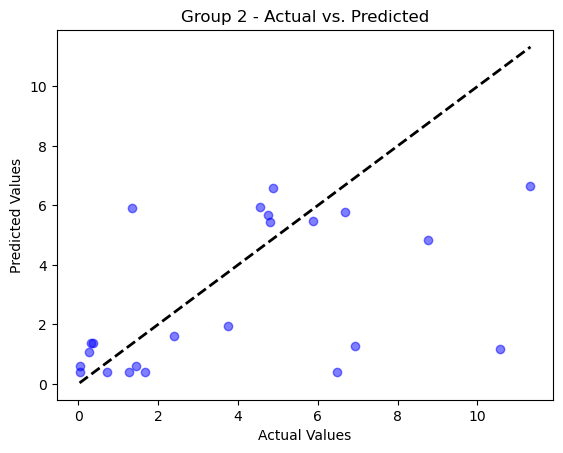

Results for group_num 2:
MSE: 10.086044145968609
R-squared: 0.10245722274703573



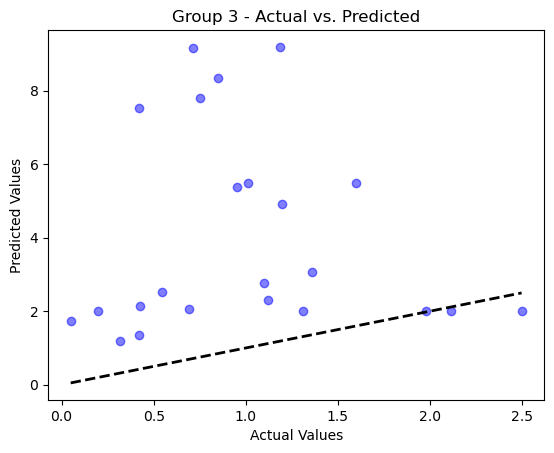

Results for group_num 3:
MSE: 16.725857217803767
R-squared: -43.71617534525864



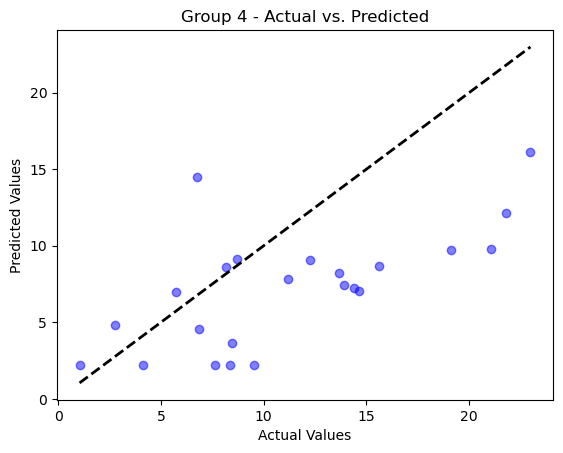

Results for group_num 4:
MSE: 35.93335506293293
R-squared: -0.02323332109075449



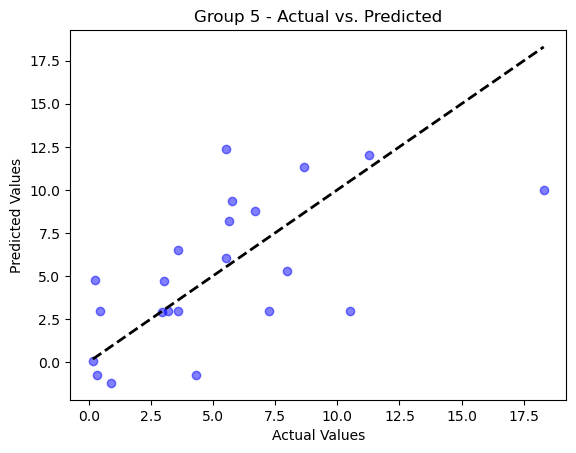

Results for group_num 5:
MSE: 13.657377030181776
R-squared: 0.24592577284478156



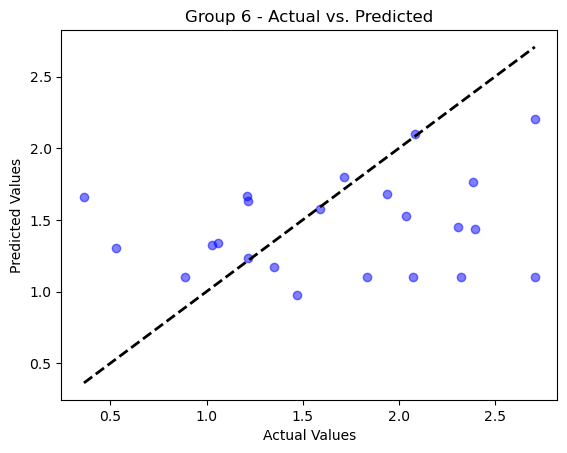

Results for group_num 6:
MSE: 0.4932965813281634
R-squared: -0.15840616177035982



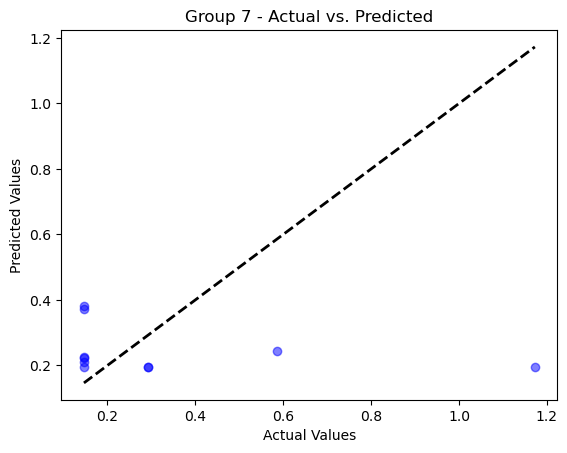

Results for group_num 7:
MSE: 0.12142407743687982
R-squared: -0.2395513677910659



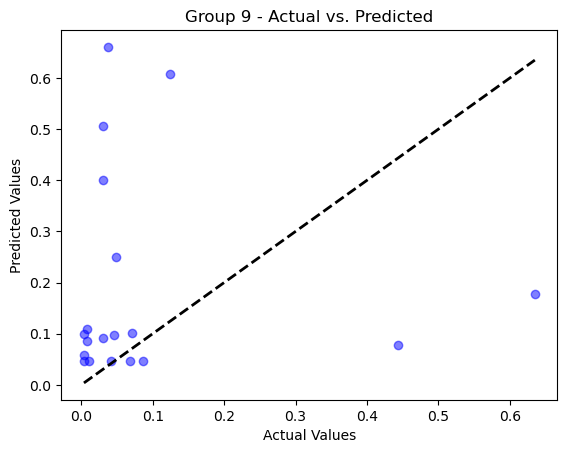

Results for group_num 9:
MSE: 0.0741861793220476
R-squared: -1.9012950197598348

Total MSE: 11.01307718499631, Total R-squared: -6.527182602868407


In [138]:
eval_test(regression_models_xgboost, merged_df_test)

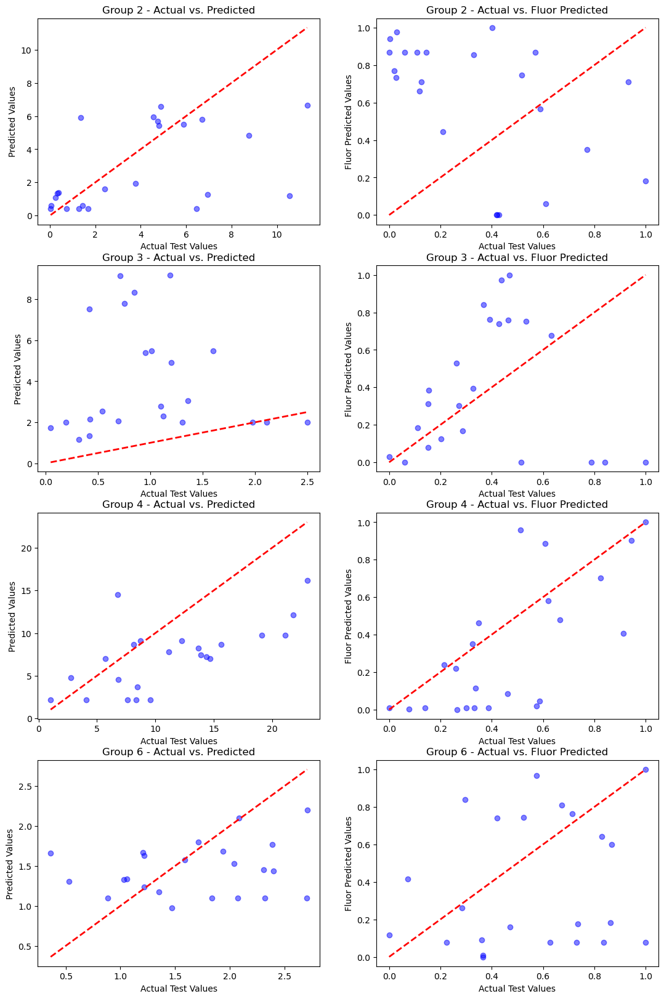

In [139]:
compare_to_fluor(regression_models_xgboost, merged_df_test, fluor_groups_map, fluor_test_df)

## SVR

In [30]:
regression_models_svr, preds_real_y_xgboost = train('svr', merged_df, test_size=0.2)

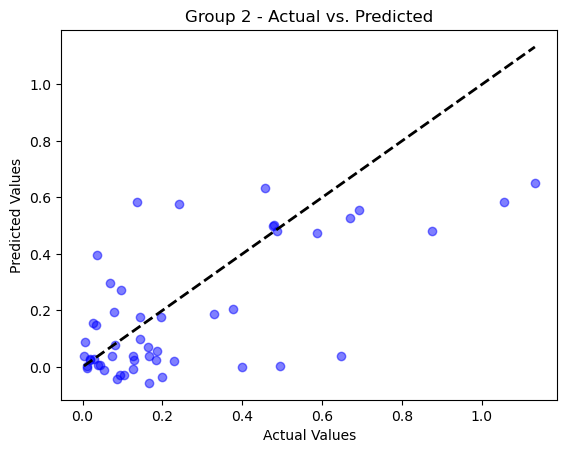

Results for group_num 2:
MSE: 0.047094150740017805
R-squared: 0.3617499419146296



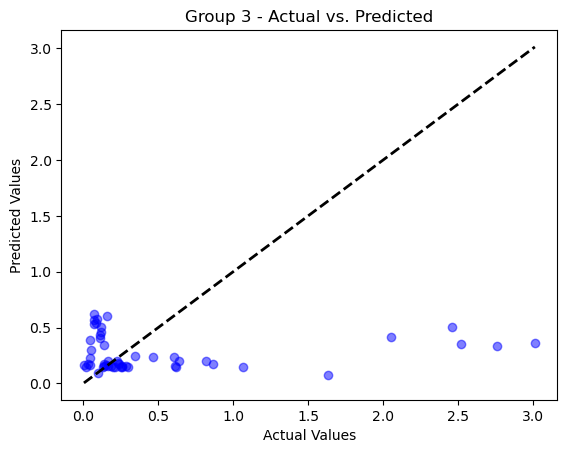

Results for group_num 3:
MSE: 0.6143071450293984
R-squared: -0.09644024283954944



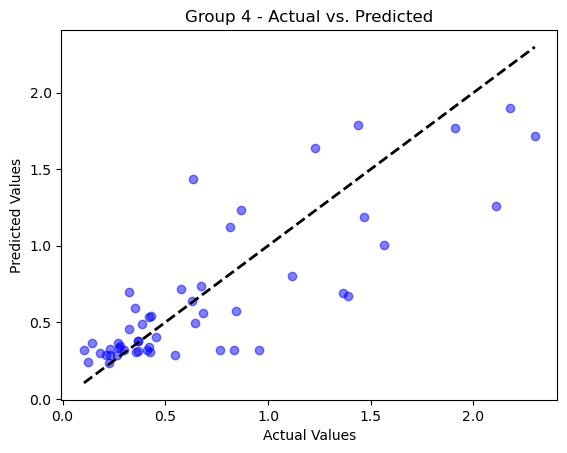

Results for group_num 4:
MSE: 0.10369636199306002
R-squared: 0.6718539570032616



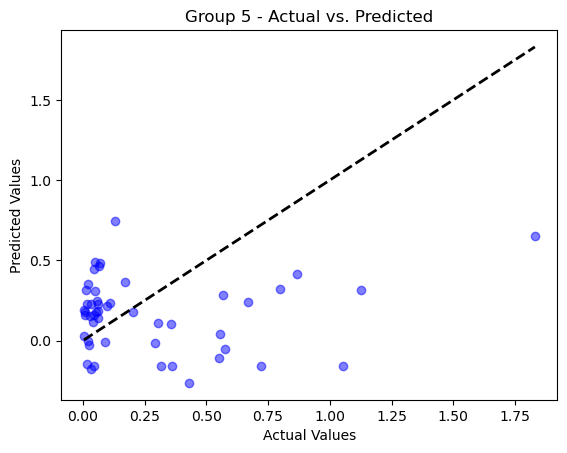

Results for group_num 5:
MSE: 0.18482234853773638
R-squared: -0.34777712898670377



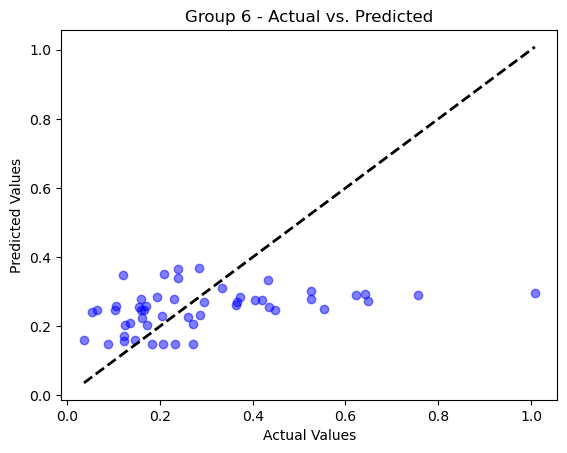

Results for group_num 6:
MSE: 0.0352857053154053
R-squared: 0.09986164888957438



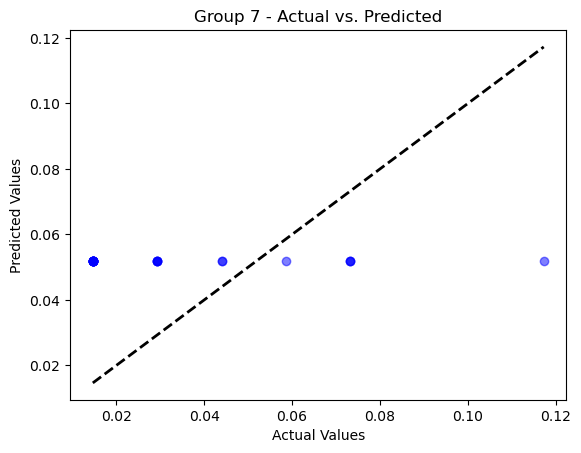

Results for group_num 7:
MSE: 0.0010711219234815004
R-squared: -0.5802263818703266



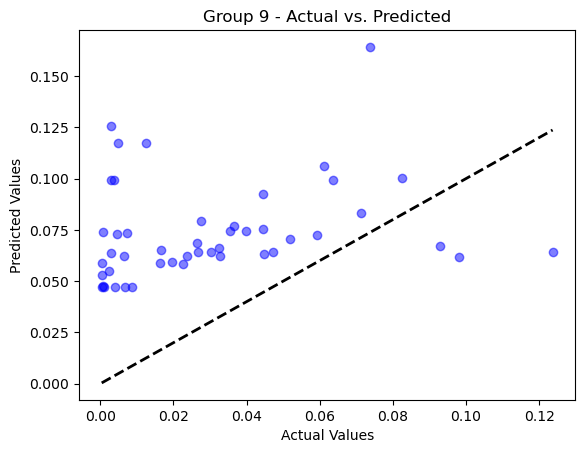

Results for group_num 9:
MSE: 0.003032825465797746
R-squared: -2.3926521303256223

Total MSE: 0.14132995128641387, Total R-squared: -0.3262329051735338


In [31]:
eval_test(regression_models_svr, merged_df_test)

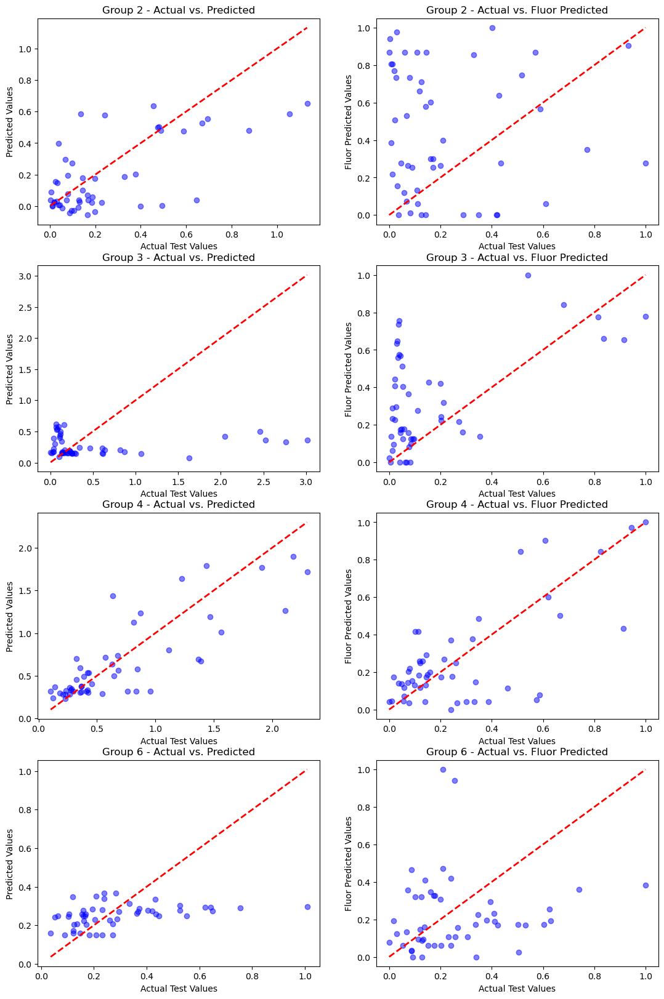

In [32]:
compare_to_fluor(regression_models_svr, merged_df_test, fluor_groups_map, fluor_test_df)

## ElasticNet Regression

In [42]:
regression_models_elf, preds_real_y_xgboost = train('bayes', merged_df, test_size=0.2)

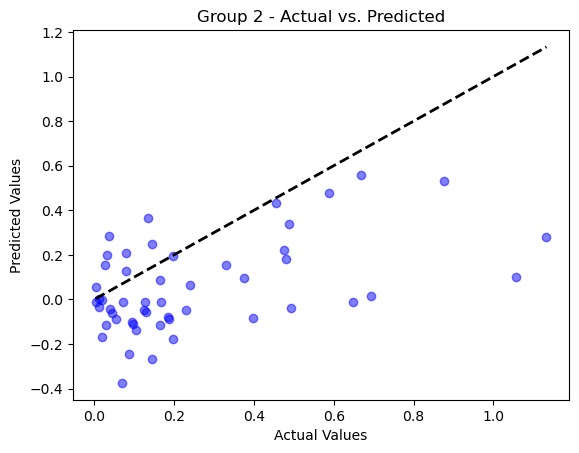

Results for group_num 2:
MSE: 0.09746104948090974
R-squared: -0.3208544907339015



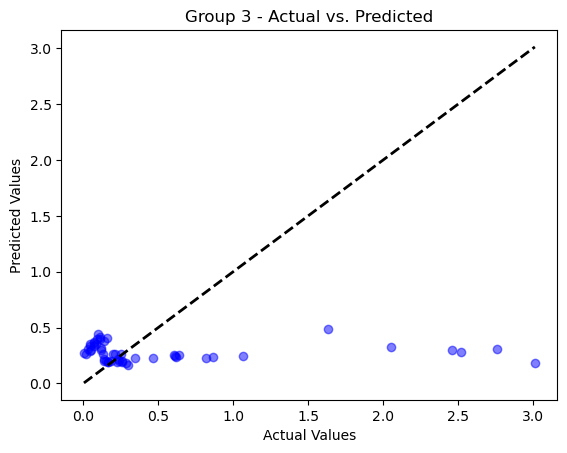

Results for group_num 3:
MSE: 0.6175761193029425
R-squared: -0.10227484036185164



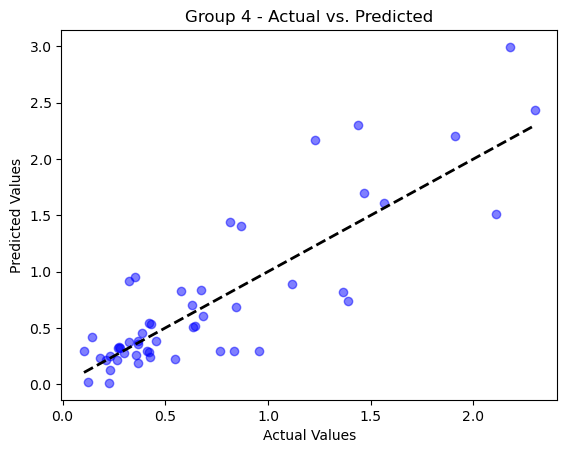

Results for group_num 4:
MSE: 0.1277708167184518
R-squared: 0.5956705991341575



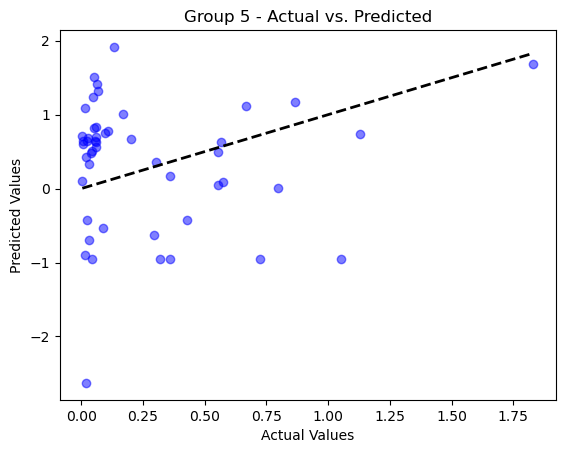

Results for group_num 5:
MSE: 0.8521097448600555
R-squared: -5.213826599409275



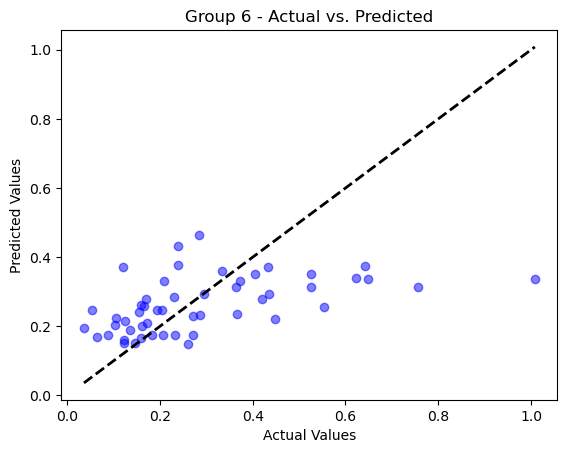

Results for group_num 6:
MSE: 0.030312582891134598
R-squared: 0.22672600313273383



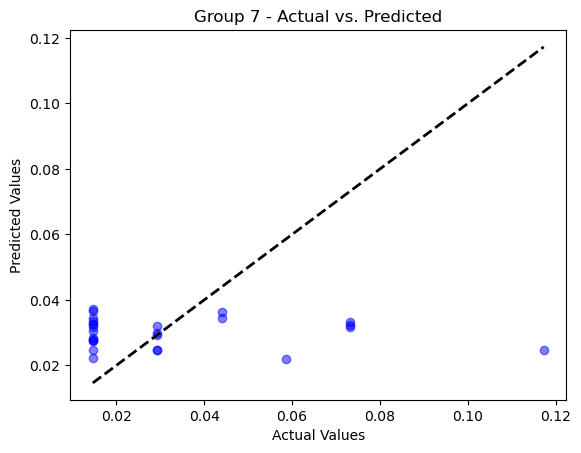

Results for group_num 7:
MSE: 0.0007290165244414569
R-squared: -0.07551822018298981



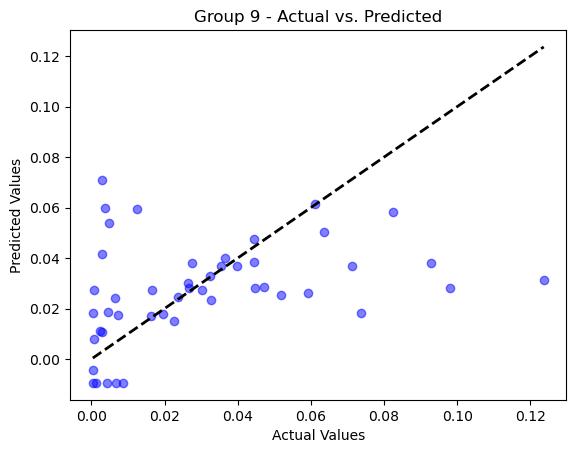

Results for group_num 9:
MSE: 0.0008737717882355563
R-squared: 0.022560397158878365

Total MSE: 0.24669044308088162, Total R-squared: -0.695359593037464


In [43]:
eval_test(regression_models_elf, merged_df_test)

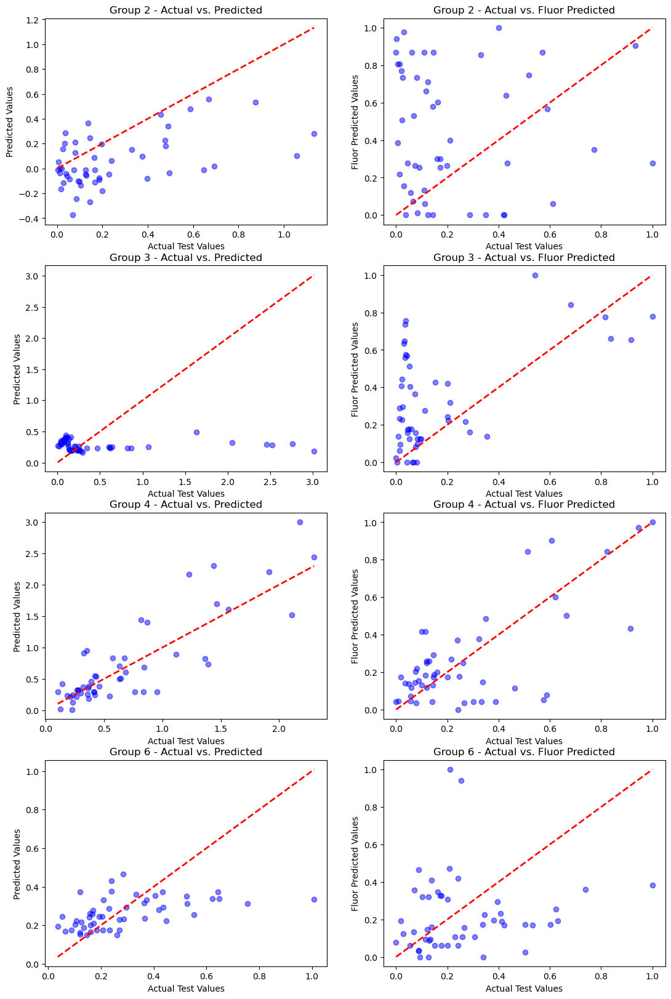

In [44]:
compare_to_fluor(regression_models_elf, merged_df_test, fluor_groups_map, fluor_test_df)